# Geospatial analysis

Installations, imports and setup

In [11]:
!pip install geopandas pandana folium matplotlib mapclassify osmnx fiona pyogrio --quiet

In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import osmnx as ox
import seaborn as sns
import pandana
import numpy as np
from scipy.spatial import cKDTree
from matplotlib.lines import Line2D
import networkx as nx
from shapely.geometry import Point

In [3]:
# Clone git repository
! git clone https://github.com/Ggenoni/Geospatial_analysis_and_representation.git
# Change directory
%cd Geospatial_analysis_and_representation/data

Cloning into 'Geospatial_analysis_and_representation'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 53 (delta 12), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (53/53), 13.71 MiB | 7.55 MiB/s, done.
Resolving deltas: 100% (12/12), done.
/content/Geospatial_analysis_and_representation/data


In [14]:
#!wget https://github.com/Ggenoni/Geospatial_analysis_and_representation/blob/main/data/isoipsa.zip
!unzip isoipsa.zip

--2025-02-18 10:49:55--  https://github.com/Ggenoni/Geospatial_analysis_and_representation/blob/main/data/isoipsa.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘isoipsa.zip.1’

isoipsa.zip.1           [ <=>                ] 223.30K  --.-KB/s    in 0.1s    

2025-02-18 10:49:55 (1.83 MB/s) - ‘isoipsa.zip.1’ saved [228660]

Archive:  isoipsa.zip
  inflating: isoipsa.geojson         


### Circoscrizioni

In [ ]:
# Load the GeoJSON file
circoscrizioni = gpd.read_file("circoscrizioni.geojson").to_crs("EPSG:32632")

In [ ]:
# Check the current coordinate reference system (CRS)
print("Current CRS:", circoscrizioni.crs)

Current CRS: EPSG:25832


In [ ]:
circoscrizioni

,numero_circ,area,perimetro,nome,fumetto,geometry
0,2,15712181,17850,MEANO,Circoscrizione n. 2 - MEANO,"POLYGON ((666651.786 5109264.903, 666650.353 5..."
1,3,36949609,38485,BONDONE,Circoscrizione n. 3 - BONDONE,"POLYGON ((660741.737 5109007.135, 660757.283 5..."
2,4,8663138,16403,SARDAGNA,Circoscrizione n. 4 - SARDAGNA,"POLYGON ((661627.54 5104968.137, 661632.747 51..."
3,6,13199398,20575,ARGENTARIO,Circoscrizione n. 6 - ARGENTARIO,"POLYGON ((667907.213 5105334.453, 667905.638 5..."
4,11,3073349,10962,S.GIUSEPPE-S.CHIARA,Circoscrizione n. 11 - S.GIUSEPPE-S.CHIARA,"POLYGON ((663312.544 5102745.129, 663330.224 5..."
5,7,15433274,18464,POVO,Circoscrizione n. 7 - POVO,"POLYGON ((669072.179 5099653.356, 668637.088 5..."
6,5,16687779,27197,RAVINA-ROMAGNANO,Circoscrizione n. 5 - RAVINA-ROMAGNANO,"POLYGON ((663871.728 5094972.066, 663852.148 5..."
7,8,16409555,24413,MATTARELLO,Circoscrizione n. 8 - MATTARELLO,"POLYGON ((663871.728 5094972.066, 663875.878 5..."
8,9,7342864,15395,VILLAZZANO,Circoscrizione n. 9 - VILLAZZANO,"POLYGON ((666987.471 5098181.576, 666974.784 5..."
9,10,6962104,15418,OLTREFERSINA,Circoscrizione n. 10 - OLTREFERSINA,"POLYGON ((663813.095 5101039.248, 663813.095 5..."


Circoscrizione n. 10 - OLTREFERSINA


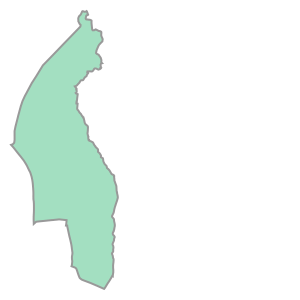

In [ ]:
print(circoscrizioni.fumetto[9])
circoscrizioni.geometry[9]

In [ ]:
circoscrizioni.explore(
    column="nome",
    tooltip="fumetto",
    cmap="tab20",
    legend=True,
    style_kwds={"color": "black", "weight": 1.5, "fillOpacity": 0.75}
)


Trento

In [203]:
circoscrizioni["city"] = "Trento"
trento = circoscrizioni[["city", "geometry"]]
trento = trento.dissolve(by= "city")
trento

,geometry
city,
Trento,"POLYGON ((663839.988 5094989.926, 663838.711 5..."


In [204]:
trento.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

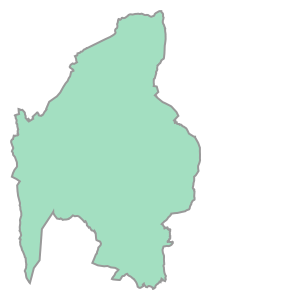

In [ ]:
trento.geometry.values[0]

In [ ]:
trento.explore(tiles="OpenTopoMap")

### Bikeability

Bike lanes in Trento

In [ ]:
# Load Circoscrizioni boundaries
circoscrizioni = gpd.read_file("circoscrizioni.geojson").to_crs(epsg=32632)

In [ ]:
# Load Bike Lanes
bike_lanes = gpd.read_file("piste_ciclabili.geojson").to_crs(epsg=32632)
bike_lanes = gpd.overlay(bike_lanes, circoscrizioni[['numero_circ', 'geometry']], how='intersection')

<Figure size 1200x800 with 0 Axes>

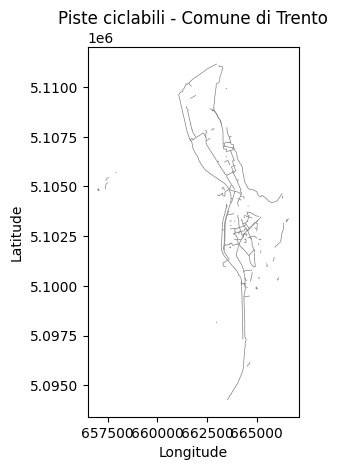

In [512]:
# Plot piste ciclabili
plt.figure(figsize=(12, 8))
bike_lanes.plot(color="gray", linewidth=0.5)
plt.title("Piste ciclabili - Comune di Trento")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

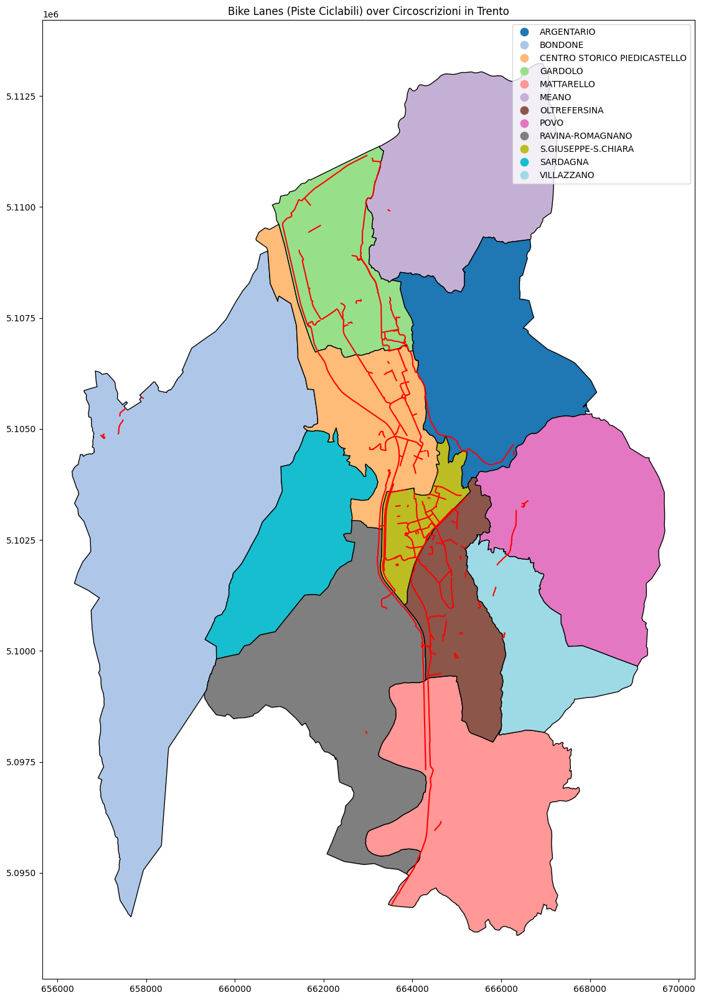

In [513]:
fig, ax = plt.subplots(figsize=(20,20))

# Plot circoscrizioni using "nome" to determine color with the tab20 colormap
circoscrizioni.plot(column="nome", ax=ax, cmap="tab20", edgecolor="black", legend = True)

# Overlay the bike lanes in red
bike_lanes.plot(ax=ax, color="red", linewidth=1.5)

ax.set_title("Bike Lanes (Piste Ciclabili) over Circoscrizioni in Trento")
plt.show()


Compute length for bike lanes

In [346]:
# Compute length for bike lanes
bike_lanes["length_m"] = bike_lanes.geometry.length  # Compute length
bike_lanes_length = bike_lanes.groupby("numero_circ")["length_m"].sum().reset_index()

bike_lanes_length

,numero_circ,length_m
0,1,19519.768651
1,2,578.170689
2,3,934.745790
3,5,5014.733493
4,6,3431.229153
5,7,1456.762493
6,8,7361.571429
7,9,753.468097
8,10,12871.210187
9,11,15651.086322


Bike lane coverage

In [136]:
# Download the street network
streets = ox.graph_from_polygon(polygon, network_type="all")

# Convert to GeoDataFrame
streets = ox.graph_to_gdfs(streets, nodes=False).reset_index()

# Keep only relevant columns
streets = streets[["geometry", "highway"]]

# Reproject to match other layers (EPSG:32632)
streets = streets.to_crs(epsg=32632)

streets = gpd.sjoin(streets, circoscrizioni, how="left", predicate="intersects")

<ipython-input-511-75030522bb70>:13: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="best")


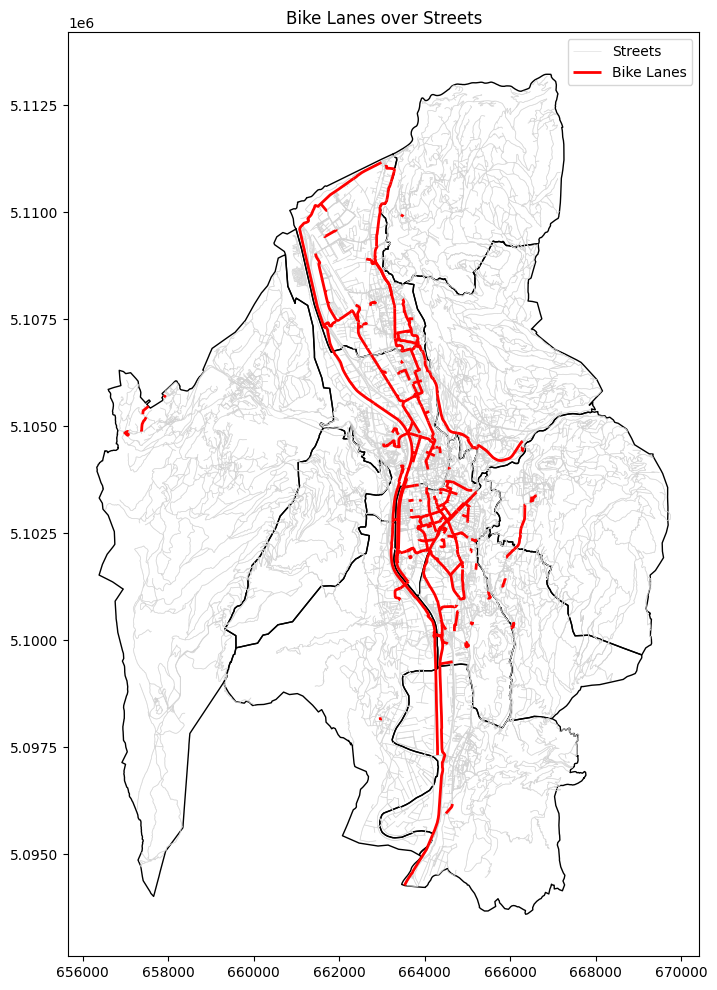

In [511]:
fig, ax = plt.subplots(figsize=(12, 12))

# Plot the street network as the base layer
streets.plot(ax=ax, color="lightgrey", linewidth=0.5, alpha=0.7, label="Streets")

# Plot the bike lanes on top
bike_lanes.plot(ax=ax, color="red", linewidth=2, label="Bike Lanes")

# Optionally, add circoscrizioni boundaries for context
circoscrizioni.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=1, label="Circoscrizioni")

plt.title("Bike Lanes over Streets")
plt.legend(loc="best")
plt.show()


In [347]:
# Compute total street length per circoscrizione
streets["length_m"] = streets.geometry.length  # Compute length
total_street_length = streets.groupby("numero_circ")["length_m"].sum().reset_index()
total_street_length.rename(columns={"length_m": "total_street_length"}, inplace=True)

# Merge with bike lane
coverage_df = bike_lanes_length.merge(total_street_length, on="numero_circ", how="left")

# Compute coverage
coverage_df["bike_lane_coverage"] = coverage_df["length_m"] / coverage_df["total_street_length"]

# Clean up column names
coverage_df = coverage_df[["numero_circ", "bike_lane_coverage"]]

# Show results
coverage_df


,numero_circ,bike_lane_coverage
0,1,0.049238
1,2,0.001818
2,3,0.001624
3,5,0.017649
4,6,0.008370
5,7,0.004397
6,8,0.021625
7,9,0.003664
8,10,0.032509
9,11,0.062310


Parking spots and rastrelliere

In [ ]:
# Load Bike Parking and Rastrelliere
bike_parking = gpd.read_file("parcheggio_protetto_bike.geojson").to_crs(epsg=32632)
rastrelliere = gpd.read_file("rastrelliere.geojson").to_crs(epsg=32632)

bike_parking = gpd.overlay(bike_parking, circoscrizioni[['numero_circ', 'geometry']], how='intersection')
rastrelliere = gpd.overlay(rastrelliere, circoscrizioni[['numero_circ', 'geometry']], how='intersection')

In [348]:
# Compute number of bike parking spots per circoscrizione
bike_parking_counts = bike_parking.groupby("numero_circ").size().reset_index(name="bike_parking_count")
rastrelliere_counts = rastrelliere.groupby("numero_circ").size().reset_index(name="rastrelliere_count")

# Merge both datasets
bike_parking_df = circoscrizioni[["numero_circ", "geometry"]].copy()
bike_parking_df = bike_parking_df.merge(bike_parking_counts, on="numero_circ", how="left")
bike_parking_df = bike_parking_df.merge(rastrelliere_counts, on="numero_circ", how="left")

# Replace NaN with 0 (for zones with no parking spots)
bike_parking_df[["bike_parking_count", "rastrelliere_count"]] = bike_parking_df[["bike_parking_count", "rastrelliere_count"]].fillna(0)

# Compute area of each circoscrizione (in km²)
bike_parking_df["area_km2"] = bike_parking_df.geometry.area / 1e6

# Compute density (parking spots per km²)
bike_parking_df["bike_parking_density"] = (bike_parking_df["bike_parking_count"] + bike_parking_df["rastrelliere_count"]) / bike_parking_df["area_km2"]

# Keep relevant columns
bike_parking_df = bike_parking_df[["numero_circ", "bike_parking_count", "rastrelliere_count",  "bike_parking_density"]]

# Display results
bike_parking_df


,numero_circ,bike_parking_count,rastrelliere_count,bike_parking_density
0,2,0.0,9.0,0.572804
1,3,0.0,15.0,0.405958
2,4,0.0,1.0,0.115432
3,6,0.0,10.0,0.757610
4,11,3.0,124.0,41.322993
5,7,0.0,10.0,0.647980
6,5,0.0,10.0,0.599241
7,8,0.0,12.0,0.731835
8,9,1.0,0.0,0.136299
9,10,1.0,47.0,6.894468


Natural areas

In [ ]:
# Ensure the city boundary (trento) is in WGS 84 (EPSG:4326) - global coordinate reference system that uses latitude & longitude - before using it with OSM
if trento.crs != "EPSG:4326":
    trento = trento.to_crs("EPSG:4326")
polygon = trento.geometry.iloc[0]
polygon

In [ ]:
# Download Natural Areas
natural_areas = ox.features_from_polygon(
    polygon,
    tags={"leisure": ["park"], "landuse": ["grass"]}
).to_crs(epsg=32632)
natural_areas = natural_areas.reset_index(drop=True)
natural_areas = natural_areas[natural_areas.geom_type == "Polygon"]
print(natural_areas.geom_type.unique())

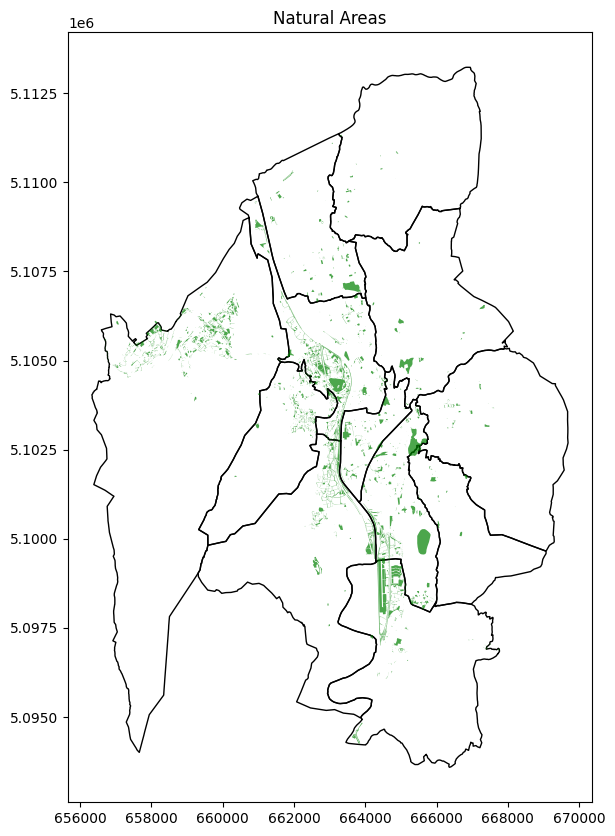

In [290]:
# Create a union of all natural areas.
natural_union = natural_areas.union_all()

# Convert the unioned geometry into a GeoSeries for plotting.
natural_union_gs = gpd.GeoSeries([natural_union], crs=natural_areas.crs)

# Plot circoscrizioni as a base layer.
ax = circoscrizioni.plot(color='none', edgecolor='black', figsize=(10, 10))

# Plot the unioned natural areas on top.
natural_union_gs.plot(ax=ax, color='green', alpha=0.7)

plt.title("Natural Areas")
plt.show()


In [349]:
buffer_distance = 200  # in meters
bike_lanes["buffer_geom"] = bike_lanes.geometry.buffer(buffer_distance)

In [391]:
# Define the overall study area as the union of all circoscrizioni.
total_polygon = circoscrizioni.union_all()

nat_df = []
# Group bike lanes by their circoscrizione (using "numero_circ")
for circ_num, group in bike_lanes.groupby('numero_circ'):
    # Compute the union of all buffers for this circoscrizione.
    union_buffer = group['buffer_geom'].union_all()

    # Clip the unioned buffer to the overall study area.
    union_buffer_clipped = union_buffer.intersection(total_polygon)

    # Compute the intersection between the clipped buffer and the natural areas union.
    intersection_geom = union_buffer_clipped.intersection(natural_union)

    # Calculate areas.
    total_buffer_area = union_buffer_clipped.area
    # Check for an empty intersection (which would happen if no natural area exists in the buffer)
    natural_area = intersection_geom.area if not intersection_geom.is_empty else 0

    # Calculate the ratio (natural area / total buffer area)
    ratio = natural_area / total_buffer_area if total_buffer_area > 0 else 0

    nat_df.append({
        'numero_circ': circ_num,
        'total_buffer_area': total_buffer_area,
        'natural_area': natural_area,
        'natural_area_ratio': ratio
    })

# Convert the results to a DataFrame.
nat_df = pd.DataFrame(nat_df)
nat_df


,numero_circ,total_buffer_area,natural_area,natural_area_ratio
0,1,6.633195e+06,216996.746209,0.032714
1,2,6.654220e+05,6277.964103,0.009435
2,3,6.146212e+05,54708.991500,0.089013
3,5,2.229376e+06,330322.948648,0.148168
4,6,1.631509e+06,36652.793761,0.022466
5,7,6.976019e+05,5923.344235,0.008491
6,8,2.455577e+06,338747.504042,0.137950
7,9,7.817869e+05,14661.292386,0.018754
8,10,4.697045e+06,402561.071947,0.085705
9,11,3.912722e+06,329198.612444,0.084135


<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


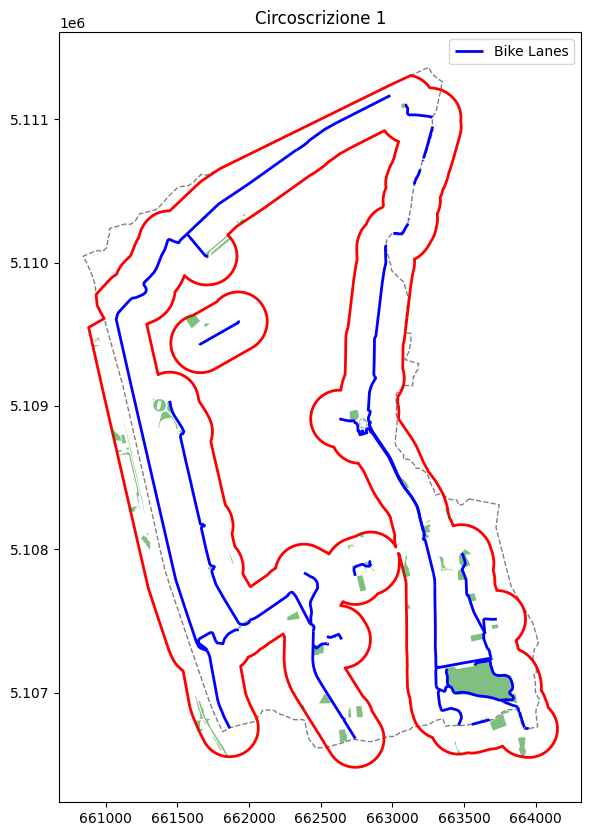

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


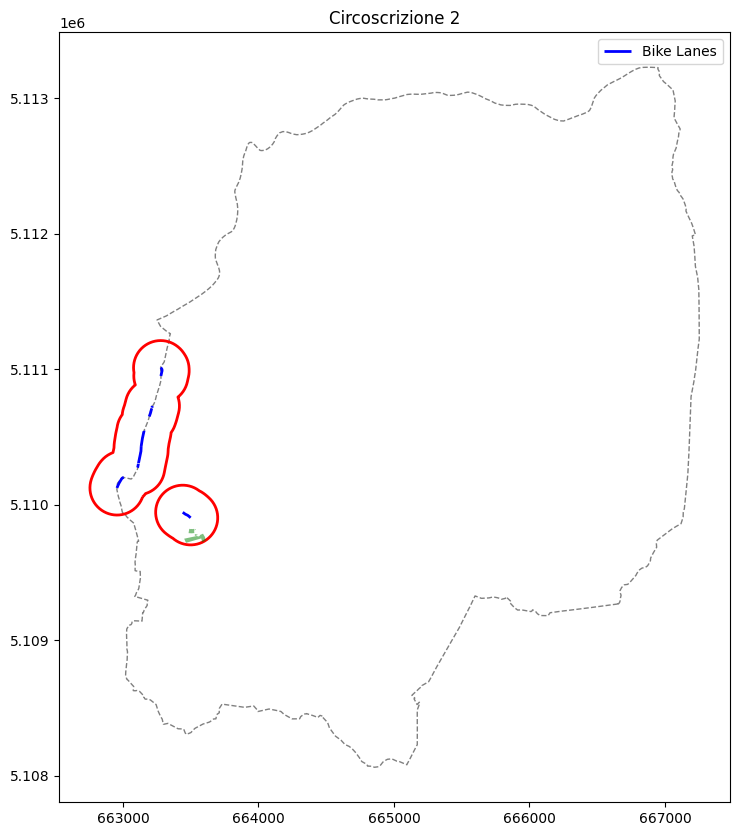

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


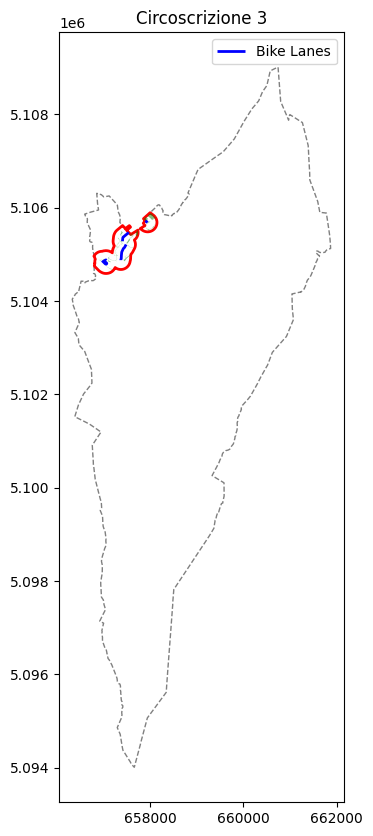

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


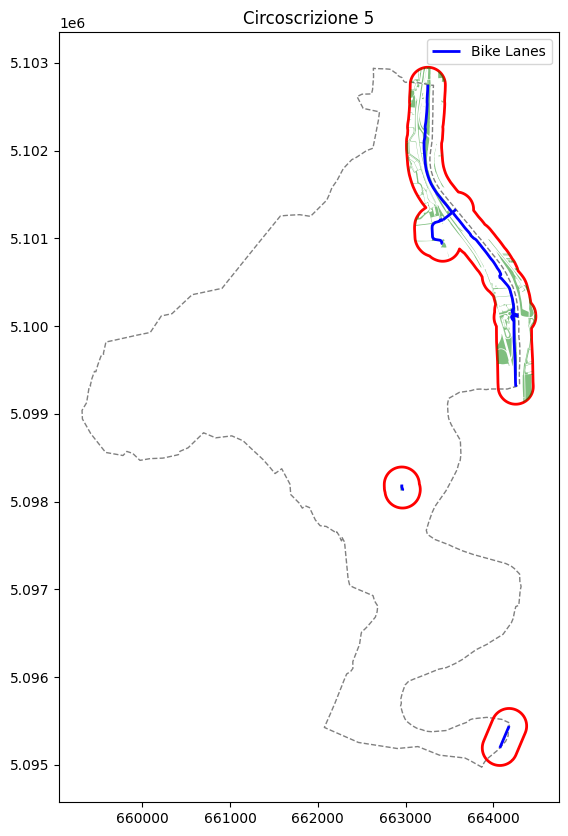

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


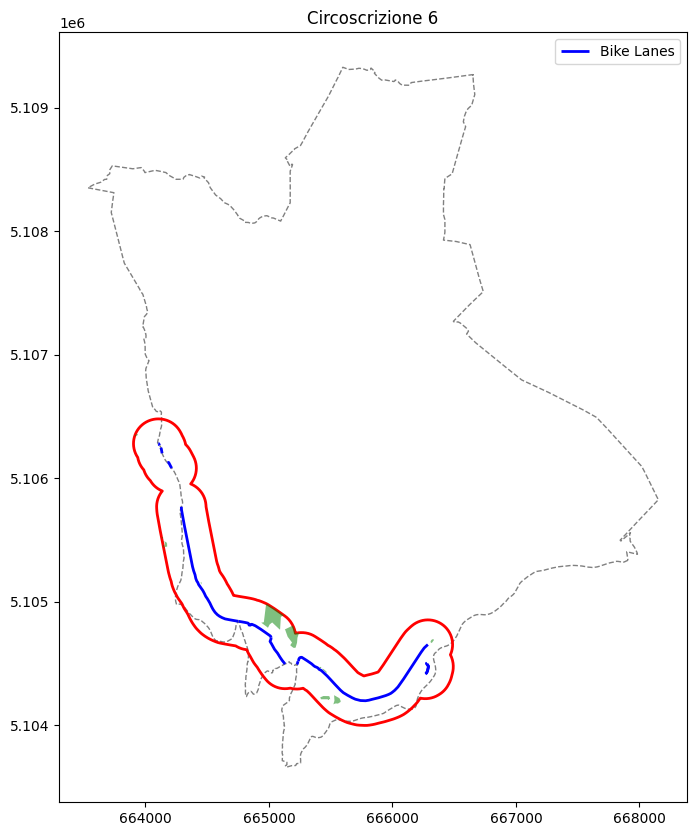

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


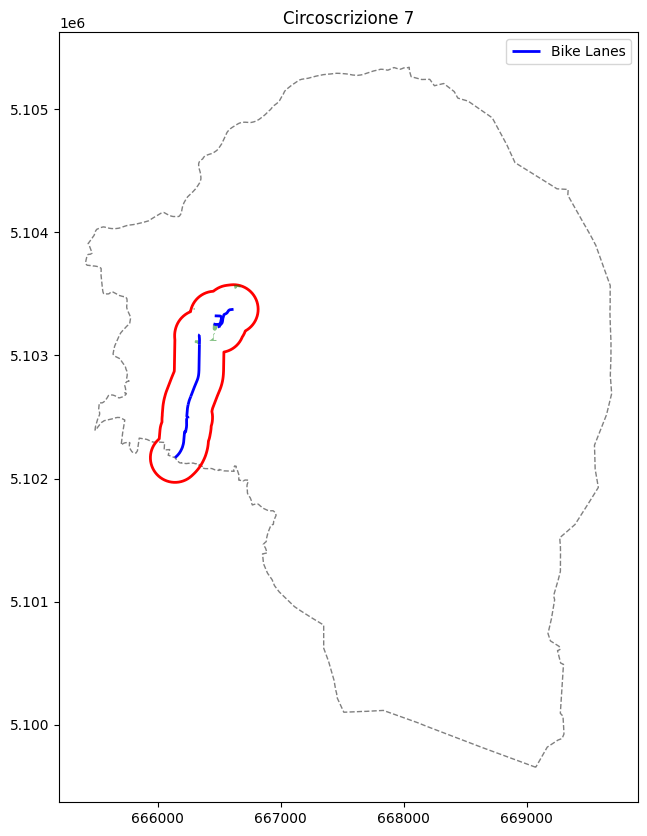

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


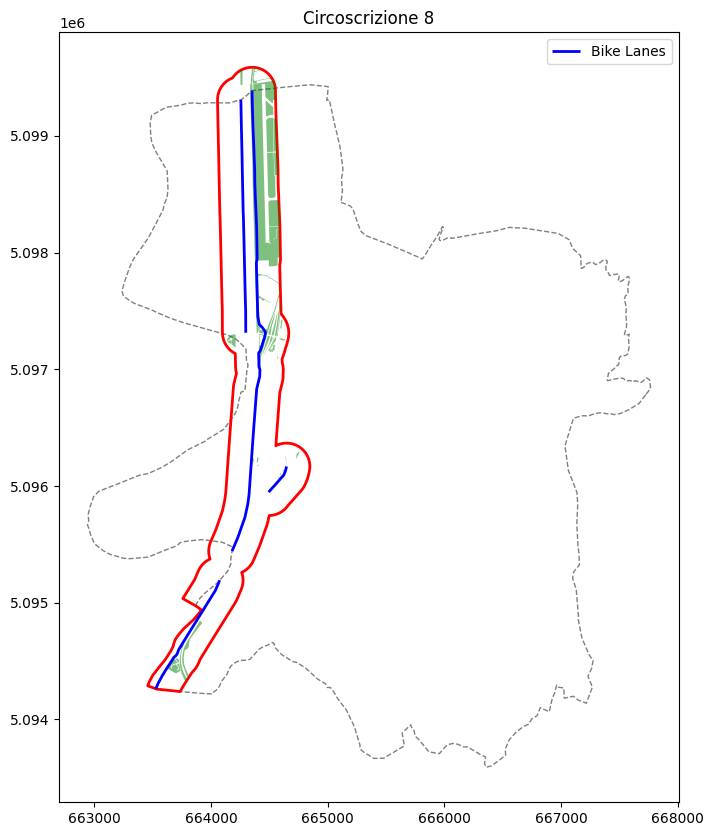

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


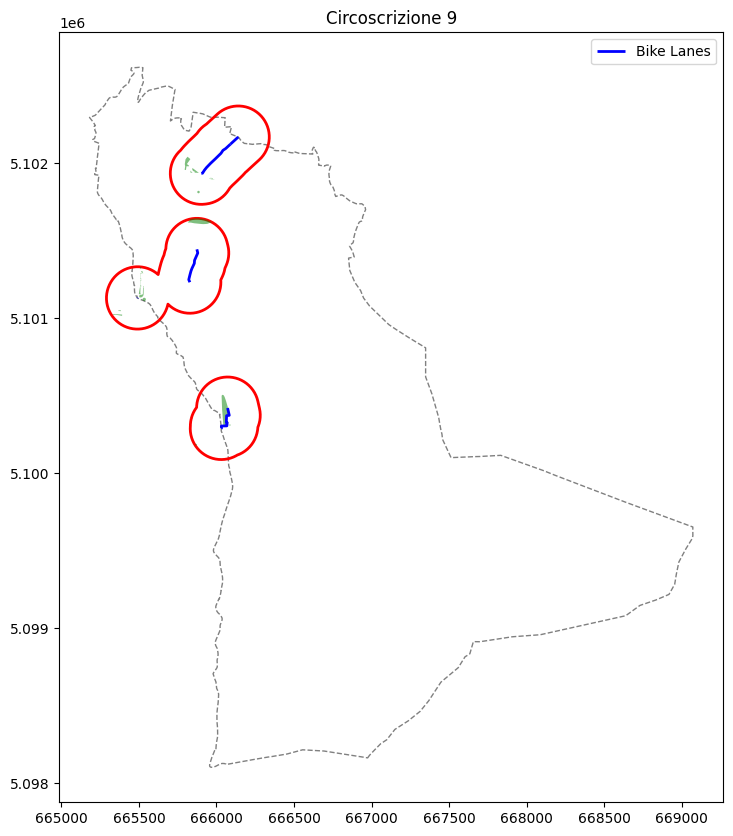

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


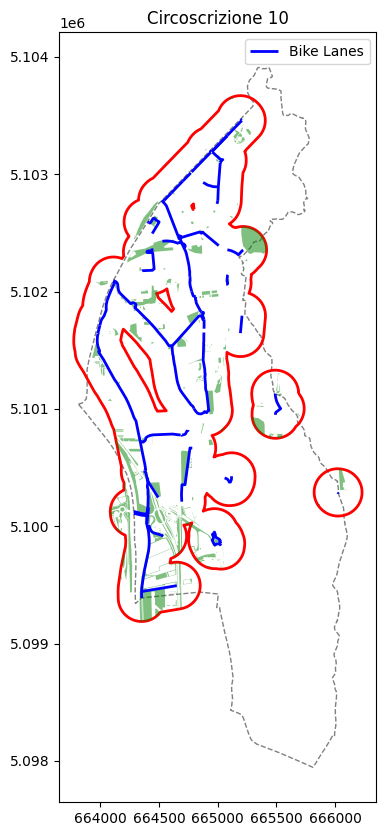

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


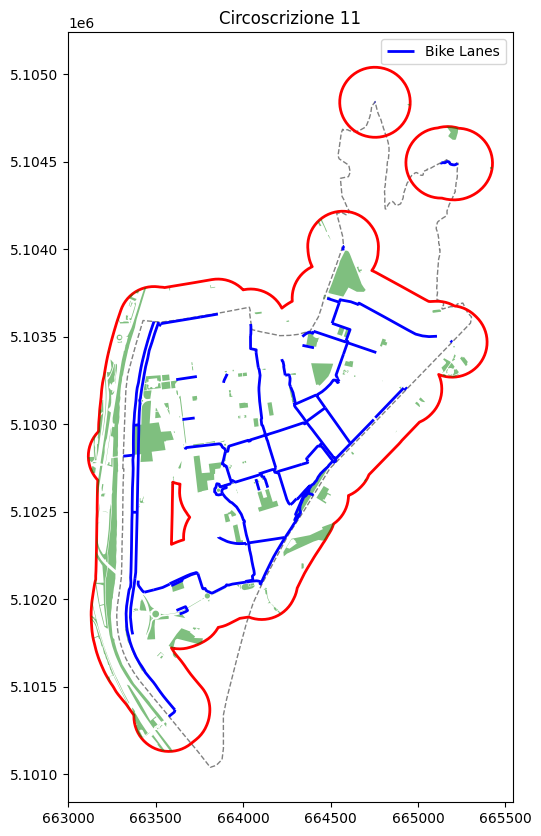

<ipython-input-392-dafb05192349>:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


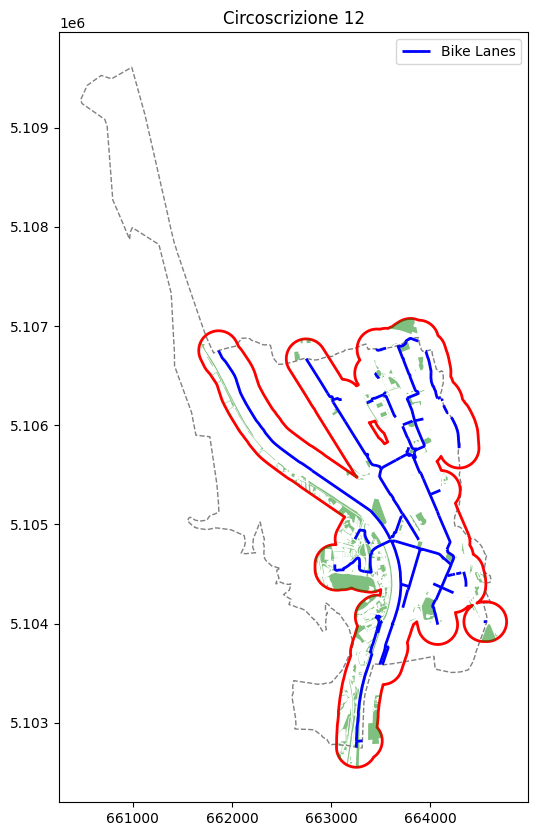

In [392]:
# Loop over each circoscrizione in the bike lanes data
for circ_num, group in bike_lanes.groupby('numero_circ'):
    fig, ax = plt.subplots(figsize=(10, 10))

    # Optional: Plot the circoscrizione boundary if available
    circ_boundary = circoscrizioni[circoscrizioni['numero_circ'] == circ_num]
    if not circ_boundary.empty:
        circ_boundary.plot(ax=ax, facecolor='none', edgecolor='gray', linestyle='--', label='Circoscrizione')

    # Plot the individual bike lanes (blue)
    group.plot(ax=ax, color='blue', label='Bike Lanes', linewidth=2)

    # Compute the union of the buffers for this circoscrizione.
    # If your bike lanes GeoSeries has a union_all() method, use it; otherwise, use unary_union.
    if hasattr(group['buffer_geom'], 'union_all'):
        union_buffer = group['buffer_geom'].union_all()
    else:
        union_buffer = group['buffer_geom'].unary_union

    # Clip the unioned buffer to the overall total polygon.
    union_buffer = union_buffer.intersection(total_polygon)

    # Convert the unioned buffer to a GeoSeries for plotting (red outline)
    union_buffer_gs = gpd.GeoSeries([union_buffer], crs=group.crs)
    union_buffer_gs.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2, label='Buffer Union')

    # Compute the natural area within the unioned buffer (intersection with natural_union)
    intersection_geom = union_buffer.intersection(natural_union)
    intersection_gs = gpd.GeoSeries([intersection_geom], crs=group.crs)
    intersection_gs.plot(ax=ax, color='green', alpha=0.5, label='Natural Area')

    plt.title(f"Circoscrizione {circ_num}")
    plt.legend()
    plt.show()


<ipython-input-393-911df9b15823>:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20")
<ipython-input-393-911df9b15823>:36: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc='best')


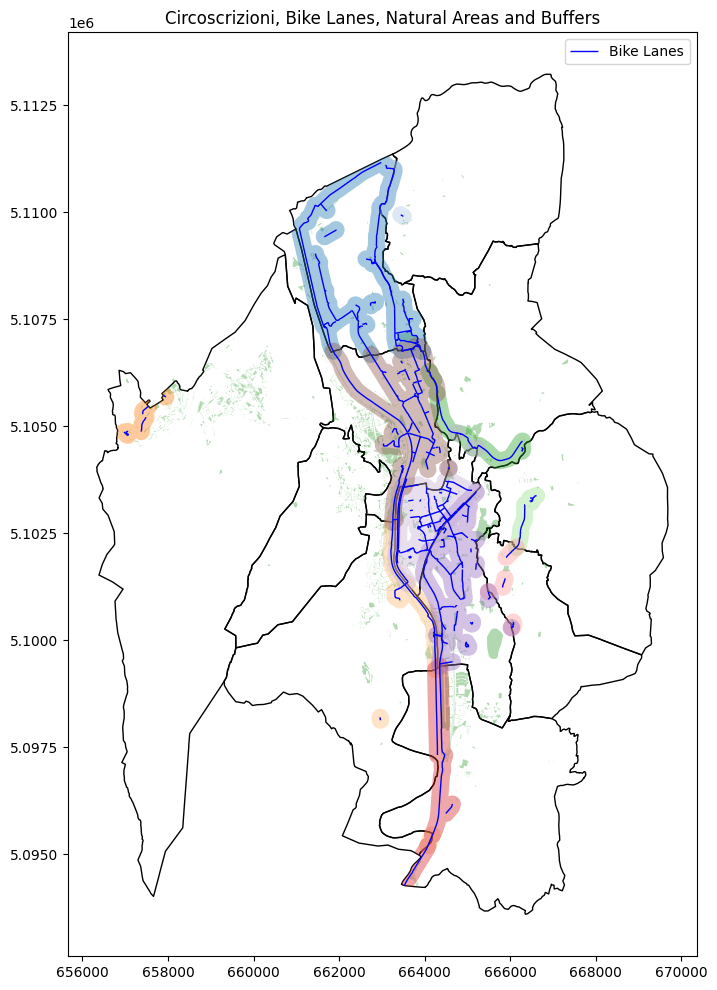

In [393]:
fig, ax = plt.subplots(figsize=(12, 12))

# Plot circoscrizioni boundaries.
circoscrizioni.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Circoscrizioni')

# Plot the natural areas union (semi-transparent green).
natural_union_gs.plot(ax=ax, color='green', alpha=0.3, label='Natural Areas')

# Plot individual bike lanes (blue).
bike_lanes.plot(ax=ax, color='blue', linewidth=1, label='Bike Lanes')

# --- Plot the buffers for each circoscrizione in a different color ---
cmap = cm.get_cmap("tab20")
unique_circos = sorted(bike_lanes['numero_circ'].unique())
for i, circ_num in enumerate(unique_circos):
    # Select bike lanes for this circoscrizione.
    group = bike_lanes[bike_lanes['numero_circ'] == circ_num]

    # Compute the union of their buffers (merging overlapping areas).
    union_buffer = group['buffer_geom'].union_all()

    # Clip the unioned buffer to the overall total polygon.
    clipped_buffer = union_buffer.intersection(total_polygon)

    # Convert the (clipped) unioned buffer to a GeoSeries for plotting.
    union_buffer_gs = gpd.GeoSeries([clipped_buffer], crs=group.crs)

    # Select a color from the colormap (using modulo in case there are >20 groups).
    color = cmap(i % 20)

    # Plot the unioned (and clipped) buffer (filled with color, no edge).
    union_buffer_gs.plot(ax=ax, facecolor=color, edgecolor='none', alpha=0.4,
                          label=f'Buffer Circ {circ_num}')

plt.title("Circoscrizioni, Bike Lanes, Natural Areas and Buffers")
plt.legend(loc='best')
plt.show()

Points of interest

In [ ]:
# Download POIs
pois = ox.features_from_polygon(
    polygon,
    tags={"amenity": True, "shop": True, "office": True}  # Get all POIs with these categories
).to_crs(epsg=32632)
pois = pois.reset_index(drop=True)
pois = pois[pois.geom_type == "Point"]
print(pois.geom_type.unique())

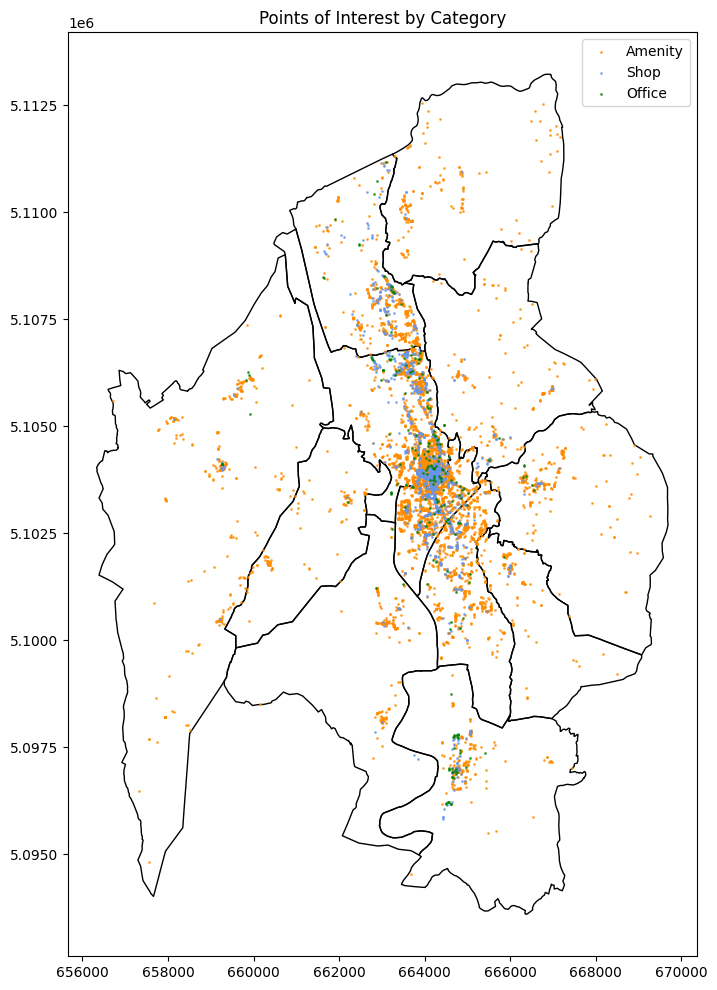

In [293]:
# Create subsets of POIs for each category:
amenity_pois = pois[pois['amenity'].notna()]
shop_pois = pois[pois['shop'].notna()]
office_pois = pois[pois['office'].notna()]


# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))

# Plot circoscrizioni boundaries
circoscrizioni.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)

# Plot each subset of POIs with a distinct marker and color:
amenity_pois.plot(ax=ax, marker='o', color='darkorange', markersize=1, label='Amenity', alpha=0.7)
shop_pois.plot(ax=ax, marker='o', color='cornflowerblue', markersize=1, label='Shop', alpha=0.7)
office_pois.plot(ax=ax, marker='o', color='green', markersize=1, label='Office', alpha=0.7)


plt.title("Points of Interest by Category")
plt.legend(loc='upper right')
plt.show()


In [383]:
# Make a copy and set the active geometry to the buffer_geom column.
buffers = bike_lanes[["numero_circ", "buffer_geom", "geometry"]].copy()
buffers = buffers.set_geometry("buffer_geom")

# Now dissolve the buffers by circoscrizione.
buffers_union = buffers.dissolve(by="numero_circ")


In [384]:
# 2. Use a spatial join to assign each POI to its circoscrizione’s unioned buffer.
# Using the "within" predicate ensures that only POIs fully contained in the buffer are counted.
pois_in_buffer_union = gpd.sjoin(pois, buffers_union, how="inner", predicate="within")

In [385]:
# 3. Count the number of POIs per circoscrizione.
poi_counts_buffer = pois_in_buffer_union.groupby("numero_circ").size().reset_index(name="poi_count")

In [386]:
# 4. Merge these counts back with the unioned buffers.
poi_df = buffers_union.merge(poi_counts_buffer, on="numero_circ", how="left")
poi_df["poi_count"] = poi_df["poi_count"].fillna(0)

In [387]:
# 5. Compute the area of each unioned buffer in km².
poi_df["buffer_area_km2"] = poi_df.geometry.area / 1e6

In [388]:
# 6. Calculate POI density (POIs per km²) for each circoscrizione.
poi_df["poi_density"] = poi_df["poi_count"] / poi_df["buffer_area_km2"]

# Inspect results:
poi_df


,numero_circ,buffer_geom,geometry,poi_count,buffer_area_km2,poi_density
0,1,"MULTIPOLYGON (((662027.451 5106874.714, 662028...","LINESTRING (663951.98 5106747.142, 663947.068 ...",669.0,6.779886,98.674221
1,2,"MULTIPOLYGON (((663365.114 5109753.969, 663352...","LINESTRING (663499.805 5109902.914, 663486.845...",37.0,0.665422,55.603816
2,3,"MULTIPOLYGON (((657003.524 5105072.792, 657023...","LINESTRING (656971.436 5104864.173, 657038.821...",0.0,0.721864,0.000000
3,5,"MULTIPOLYGON (((664228.446 5095064.403, 664215...","LINESTRING (663426.467 5101209.479, 663415.698...",97.0,2.229376,43.509927
4,6,"POLYGON ((665214.607 5104743.852, 665232.139 5...","LINESTRING (666266.78 5104413.9, 666275.11 510...",86.0,1.631509,52.711932
5,7,"POLYGON ((666266.566 5102013.764, 666264.174 5...","LINESTRING (666141.774 5102169.889, 666158.329...",26.0,0.697602,37.270538
6,8,"POLYGON ((664559.012 5096347.205, 664577.018 5...","LINESTRING (664647.489 5096167.84, 664641.939 ...",31.0,2.641255,11.736845
7,9,"MULTIPOLYGON (((665833.636 5100334.529, 665837...","LINESTRING (665873.393 5101444.171, 665879.286...",48.0,0.781787,61.397804
8,10,"MULTIPOLYGON (((664155.294 5099502.151, 664174...","LINESTRING (664662.46 5102473.246, 664563.722 ...",820.0,4.697045,174.577849
9,11,"MULTIPOLYGON (((663773.47 5101482.834, 663776....","LINESTRING (663652.777 5102116.055, 663703.443...",1954.0,3.912722,499.396554


<ipython-input-328-48249c759f5d>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab20")
<ipython-input-328-48249c759f5d>:51: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc='best', fontsize='small', ncol=2)


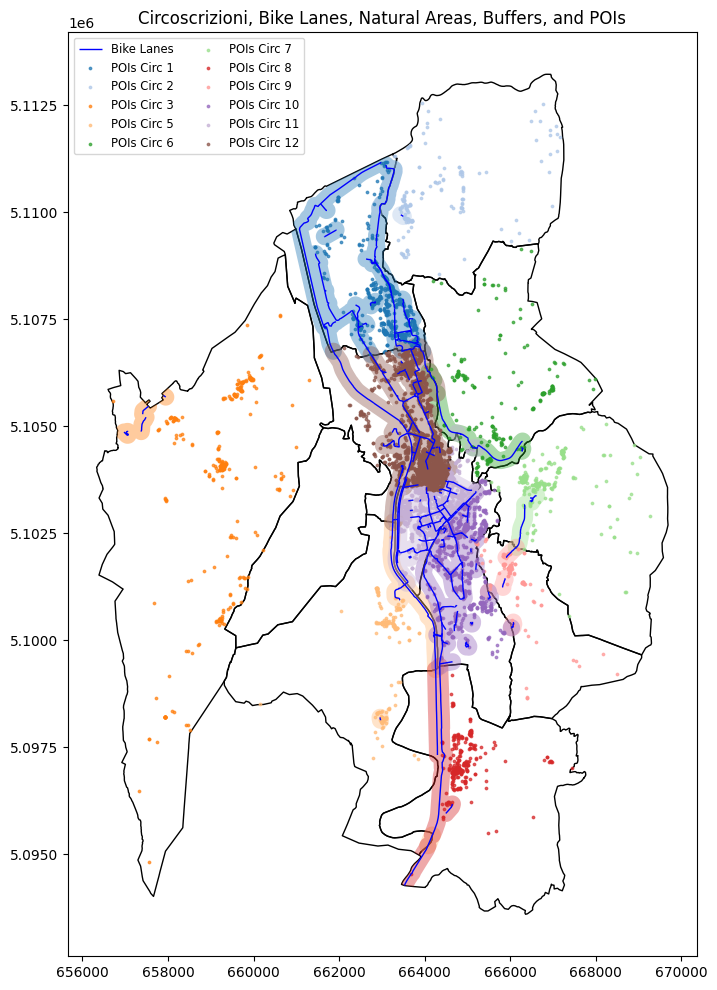

In [328]:
total_polygon = circoscrizioni.union_all()

# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))

circoscrizioni.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1)


bike_lanes.plot(ax=ax, color='blue', linewidth=1, label='Bike Lanes')

# --- Plot buffers per circoscrizione (colored by tab20) ---
cmap = cm.get_cmap("tab20")
unique_circos = sorted(bike_lanes['numero_circ'].unique())

for i, circ_num in enumerate(unique_circos):
    # Select bike lanes for this circoscrizione.
    group = bike_lanes[bike_lanes['numero_circ'] == circ_num]

    # Compute the union of their buffers.
    union_buffer = group['buffer_geom'].union_all()

    # Clip the unioned buffer to the overall study area.
    clipped_buffer = union_buffer.intersection(total_polygon)

    # Convert to a GeoSeries for plotting.
    union_buffer_gs = gpd.GeoSeries([clipped_buffer], crs=group.crs)

    # Get a color for this circoscrizione.
    color = cmap(i % 20)

    # Plot the clipped buffer.
    union_buffer_gs.plot(ax=ax, facecolor=color, edgecolor='none', alpha=0.4,
                          label=f'Buffer Circ {circ_num}')

# --- Plot POIs per circoscrizione ---
for i, circ_num in enumerate(unique_circos):
    # Get the circoscrizione boundary.
    circ_boundary = circoscrizioni[circoscrizioni['numero_circ'] == circ_num]

    # Use a spatial join to extract POIs that are strictly within the circoscrizione.
    pois_in_circ = gpd.sjoin(pois, circ_boundary, how="inner", predicate="within")

    # Use the same color from tab20 as for the buffer.
    color = cmap(i % 20)

    # Plot these POIs.
    pois_in_circ.plot(ax=ax, marker='o', color=color, markersize=3, alpha=0.7,
                      label=f'POIs Circ {circ_num}')

plt.title("Circoscrizioni, Bike Lanes, Natural Areas, Buffers, and POIs")
plt.legend(loc='best', fontsize='small', ncol=2)
plt.show()


Slope

In [ ]:
# Load Elevation Data (Isoipse)
elevation = gpd.read_file("isoipsa.geojson", engine="fiona").to_crs(epsg=32632)
elevation = gpd.overlay(elevation, circoscrizioni[['numero_circ', 'geometry']], how='intersection')

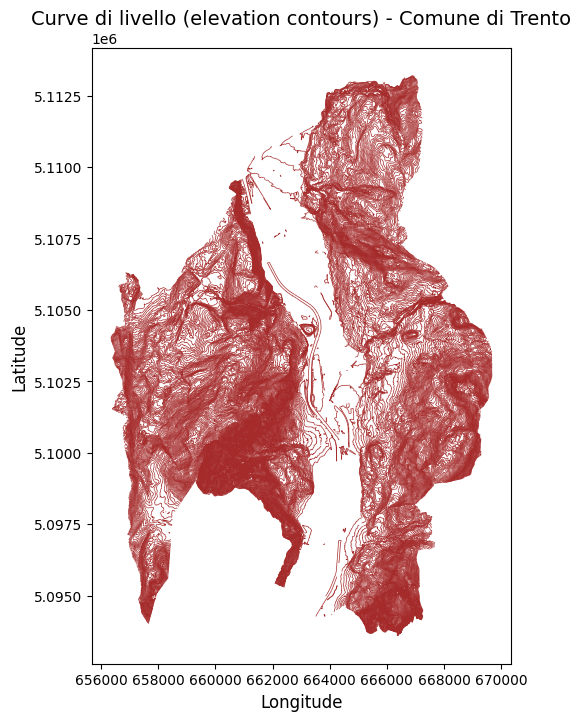

In [330]:
plt.rcdefaults()
# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot isoipse
elevation.plot(ax=ax, color="brown", linewidth=0.5)

# Set title and labels
ax.set_title("Curve di livello (elevation contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

plt.show()

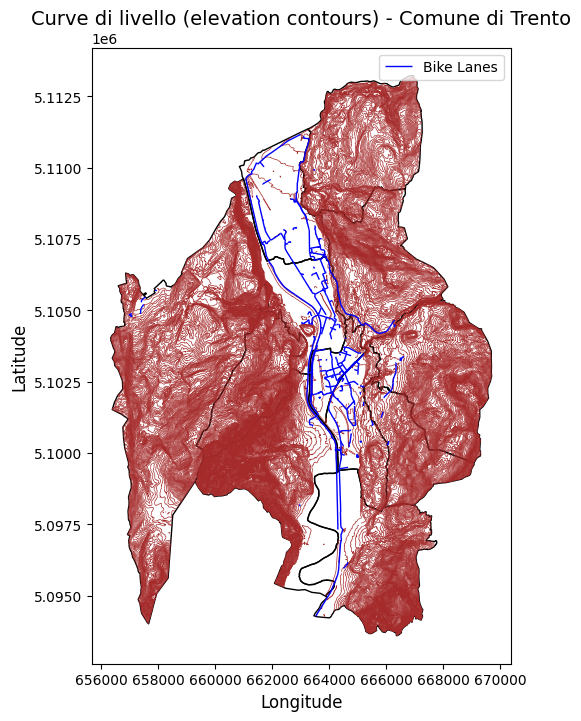

In [336]:
plt.rcdefaults()
# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot elevation (isoipse) as brown contours
elevation.plot(ax=ax, color="brown", linewidth=0.5)

# Plot circoscrizioni boundaries (no fill, black edges)
circoscrizioni.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=1)

# Plot bike lanes in red
bike_lanes.plot(ax=ax, color="blue", linewidth=1, label="Bike Lanes")

# Set title and labels
ax.set_title("Curve di livello (elevation contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# Add legend
ax.legend(loc="best")

plt.show()


In [332]:
def compute_slope(bike_lane_geom, isoipsa, sample_distance=10):
    """
    Compute an approximate slope percentage for a bike lane using isoipsa.

    Parameters:
      bike_lane_geom: Shapely LineString geometry for a bike lane.
      isoipsa: GeoDataFrame of isoipsa that contains an elevation attribute (e.g., "dxf_elevat").
      sample_distance: Distance interval (in meters) at which to sample points along the bike lane.

    Returns:
      slope_percent: Approximate slope percentage.
    """
    # Number of sample points along the bike lane
    num_points = int(np.ceil(bike_lane_geom.length / sample_distance)) + 1
    # Sample points along the bike lane
    sample_points = [bike_lane_geom.interpolate(dist) for dist in np.linspace(0, bike_lane_geom.length, num_points)]

    # Create a GeoDataFrame for the sample points
    samples_gdf = gpd.GeoDataFrame(geometry=sample_points, crs=isoipsa.crs)

    # Use sjoin_nearest to assign an elevation to each sample point.
    joined = gpd.sjoin_nearest(samples_gdf, isoipsa[['geometry', 'dxf_elevat']], how="left", distance_col="dist")

    # Extract elevation values from the join
    elev_values = joined["dxf_elevat"].dropna().values
    if len(elev_values) == 0:
        return np.nan  # No elevation data found

    # Calculate elevation difference and slope
    elev_diff = np.max(elev_values) - np.min(elev_values)
    slope_percent = (elev_diff / bike_lane_geom.length) * 100

    return slope_percent

#In summary, the function approximates the overall steepness of a bike lane by sampling elevation along it
#and computing the percent slope based on the maximum elevation change relative to the total length.

In [375]:
# Compute slope for each bike lane
bike_lanes["slope_percent"] = bike_lanes.geometry.apply(lambda geom: compute_slope(geom, elevation, sample_distance=30))

In [376]:
# Aggregate slope data per circoscrizione
slope_agg = bike_lanes.groupby("numero_circ")["slope_percent"].agg(
    mean_slope="mean",
    median_slope="median",
    min_slope="min",
    max_slope="max",
    std_slope="std"
).reset_index()

slope_agg

#The value 8.992692 represents an approximate slope of about 8.99%.
#This means that on average, the elevation changes by about 8.99 meters for every 100 meters of horizontal distance along the bike lane.

,numero_circ,mean_slope,median_slope,min_slope,max_slope,std_slope
0,1,0.485541,0.000000,0.000000,8.231617,1.394245
1,2,8.992692,8.992692,3.945189,14.040195,7.138248
2,3,1.635660,1.373202,0.000000,3.796234,1.936716
3,5,2.085988,0.000000,0.000000,14.234625,4.796710
4,6,1.928849,1.429324,0.000000,5.130281,2.236745
5,7,1.341709,0.000000,0.000000,4.695786,2.081449
6,8,0.073125,0.000000,0.000000,0.219376,0.126657
7,9,1.629281,0.000000,0.000000,4.440438,2.246046
8,10,0.832261,0.000000,0.000000,8.483656,1.974300
9,11,1.205047,0.000000,0.000000,14.961602,2.857889


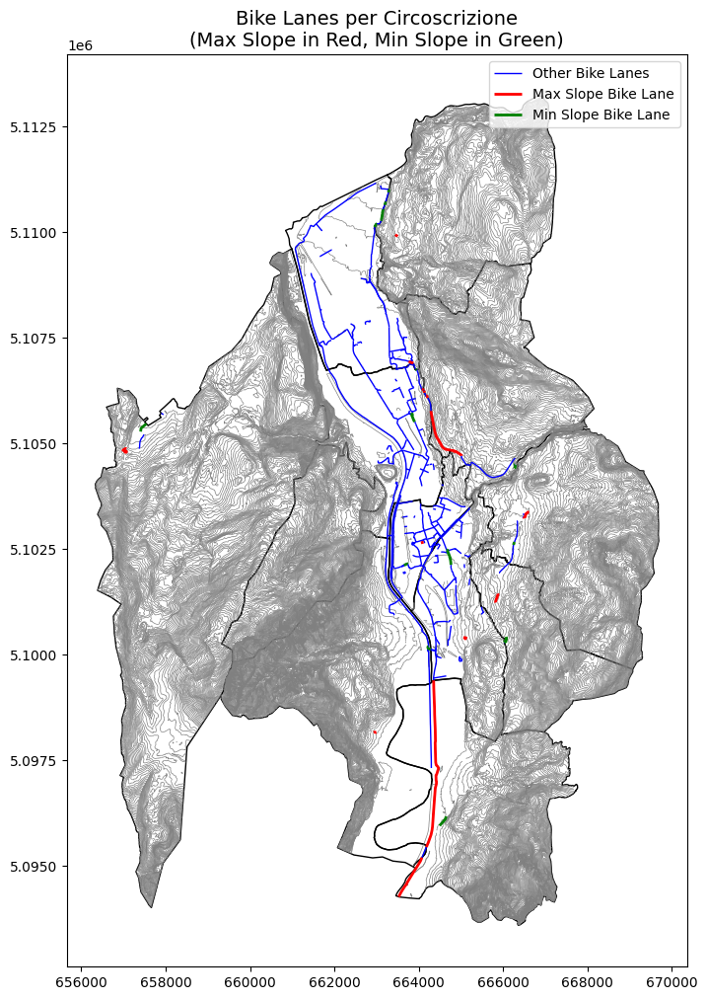

In [378]:
# Identify the bike lane indices with the maximum and minimum slope for each circoscrizione.
max_slope_idx = bike_lanes.groupby('numero_circ')['slope_percent'].idxmax()
min_slope_idx = bike_lanes.groupby('numero_circ')['slope_percent'].idxmin()

# Create GeoDataFrames for the max and min slope lanes.
max_slope_lanes = bike_lanes.loc[max_slope_idx]
min_slope_lanes = bike_lanes.loc[min_slope_idx]

# Get the remaining bike lanes (those that are neither the max nor min for their circoscrizione).
# If a circoscrizione has a single lane, it will appear in both max and min; you can decide how to handle that.
others = bike_lanes.drop(max_slope_idx).drop(min_slope_idx)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 12))

# Plot circoscrizioni boundaries.
circoscrizioni.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=1)

elevation.plot(ax=ax, color="gray", linewidth=0.5)


# Plot all bike lanes in gray.
others.plot(ax=ax, color="blue", linewidth=1, label="Other Bike Lanes")

# Plot the max slope bike lanes in red.
max_slope_lanes.plot(ax=ax, color="red", linewidth=2, label="Max Slope Bike Lane")

# Plot the min slope bike lanes in green.
min_slope_lanes.plot(ax=ax, color="green", linewidth=2, label="Min Slope Bike Lane")

# Title and legend
plt.title("Bike Lanes per Circoscrizione\n(Max Slope in Red, Min Slope in Green)", fontsize=14)
plt.legend(loc="best")
plt.show()


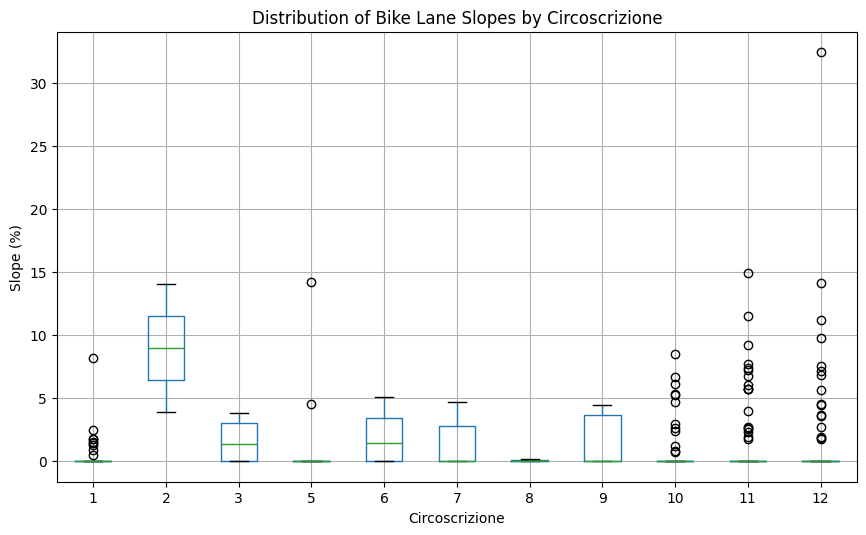

In [379]:
# Optionally, visualize the distribution with a boxplot:
fig, ax = plt.subplots(figsize=(10, 6))
bike_lanes.boxplot(column="slope_percent", by="numero_circ", ax=ax)
ax.set_title("Distribution of Bike Lane Slopes by Circoscrizione")
ax.set_xlabel("Circoscrizione")
ax.set_ylabel("Slope (%)")
plt.suptitle("")  # Remove the automatic subtitle
plt.show()


Final

In [488]:
# Start with circoscrizioni (key: numero_circ)
final_df = circoscrizioni[["numero_circ", 'nome', "geometry"]].copy()

# Merge in each indicator
final_df = final_df.merge(bike_lanes_length[["numero_circ", "length_m"]], on="numero_circ", how="left")
final_df = final_df.merge(coverage_df[["numero_circ", "bike_lane_coverage"]], on="numero_circ", how="left")
final_df = final_df.merge(bike_parking_df[["numero_circ", "bike_parking_density"]], on="numero_circ", how="left")
final_df = final_df.merge(nat_df[["numero_circ", "natural_area_ratio"]], on="numero_circ", how="left")
final_df = final_df.merge(poi_df[["numero_circ", "poi_density"]], on="numero_circ", how="left")
final_df = final_df.merge(slope_agg[["numero_circ", "mean_slope"]], on="numero_circ", how="left")

In [401]:
def normalize_series(series, invert=False):
    """Min-max normalize a pandas Series; invert if lower values are better."""
    norm = (series - series.min()) / (series.max() - series.min())
    if invert:
        norm = 1 - norm
    return norm

In [489]:
# Normalize indicators. For these indicators, higher values imply better bikeability,
# except for slope, where lower values are preferred.
final_df["length_norm"] = normalize_series(final_df["length_m"])
final_df["bike_lane_coverage_norm"] = normalize_series(final_df["bike_lane_coverage"])
final_df["bike_parking_density_norm"] = normalize_series(final_df["bike_parking_density"])
final_df["natural_area_prop_norm"] = normalize_series(final_df["natural_area_ratio"])
final_df["poi_density_norm"] = normalize_series(final_df["poi_density"])
final_df["avg_slope_norm"] = normalize_series(final_df["mean_slope"], invert=True)

In [490]:
# Compute the bikeability index as the average of all six normalized indicators (each indicator is given equal weight).
final_df["bikeability_index"] = (
    final_df["bike_lane_coverage_norm"] +
    final_df["bike_parking_density_norm"] +
    final_df["natural_area_prop_norm"] +
    final_df["poi_density_norm"] +
    final_df["avg_slope_norm"] +
    final_df["length_norm"]
) / 6

print(final_df[["numero_circ", "bikeability_index"]])

    numero_circ  bikeability_index
0             2           0.022063
1             3           0.237863
2             4                NaN
3             6           0.212487
4            11           0.868403
5             7           0.172900
6             5           0.395247
7             8           0.442168
8             9           0.177553
9            10           0.523284
10            1           0.541153
11           12           0.691767


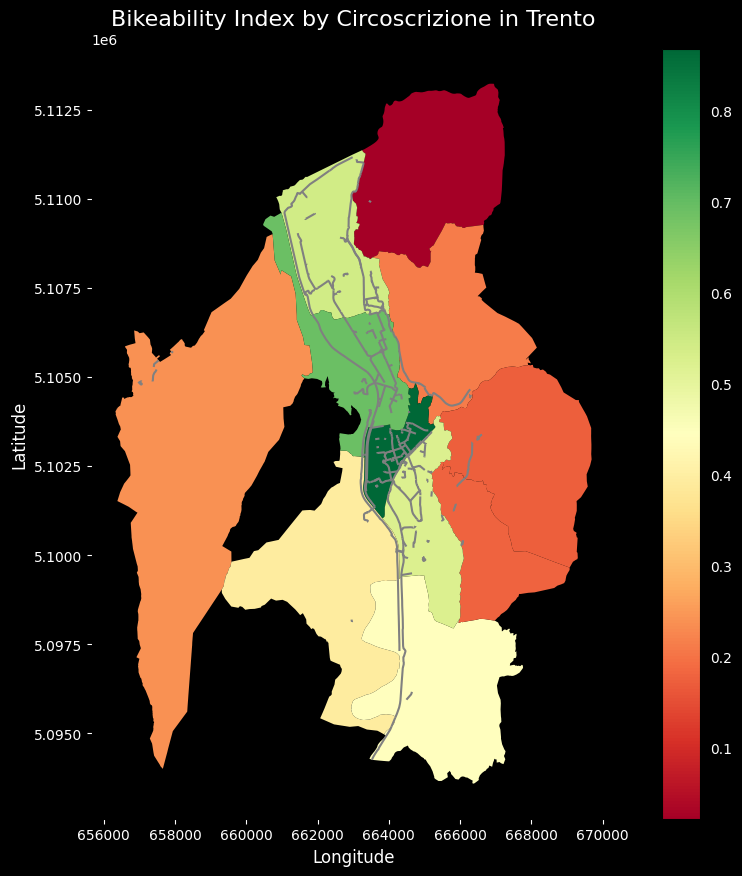

In [491]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), facecolor='black')
ax.set_facecolor('black')

# Plot the choropleth map using RdYlGn.
final_df.plot(column="bikeability_index", cmap="RdYlGn", legend=True, ax=ax)

# Overlay the bike lanes in red.
bike_lanes.plot(ax=ax, color="gray", linewidth=1.5)

# Set title and labels in white.
ax.set_title("Bikeability Index by Circoscrizione in Trento", color='white', fontsize=16)
ax.set_xlabel("Longitude", color='white', fontsize=12)
ax.set_ylabel("Latitude", color='white', fontsize=12)
ax.tick_params(colors='white')

# Access the colorbar (usually the last axis in the figure) and change its tick label colors.
cbar = fig.axes[-1]  # assuming the last axis is the colorbar
for label in cbar.get_yticklabels():
    label.set_color("white")

plt.show()


In [492]:
categories = [
    "Bike Lane Coverage",
    "Bike Parking",
    "Natural Areas",
    "POI Density",
    "Flatness",
    "Bike Lane Length"
]

cols = [
    "bike_lane_coverage_norm",    # Bike Lane Coverage
    "bike_parking_density_norm",  # Bike Parking
    "natural_area_prop_norm",     # Natural Areas
    "poi_density_norm",           # POI Density
    "avg_slope_norm",             # Flatness (inverted slope)
    "length_norm"                 # Bike Lane Length
]

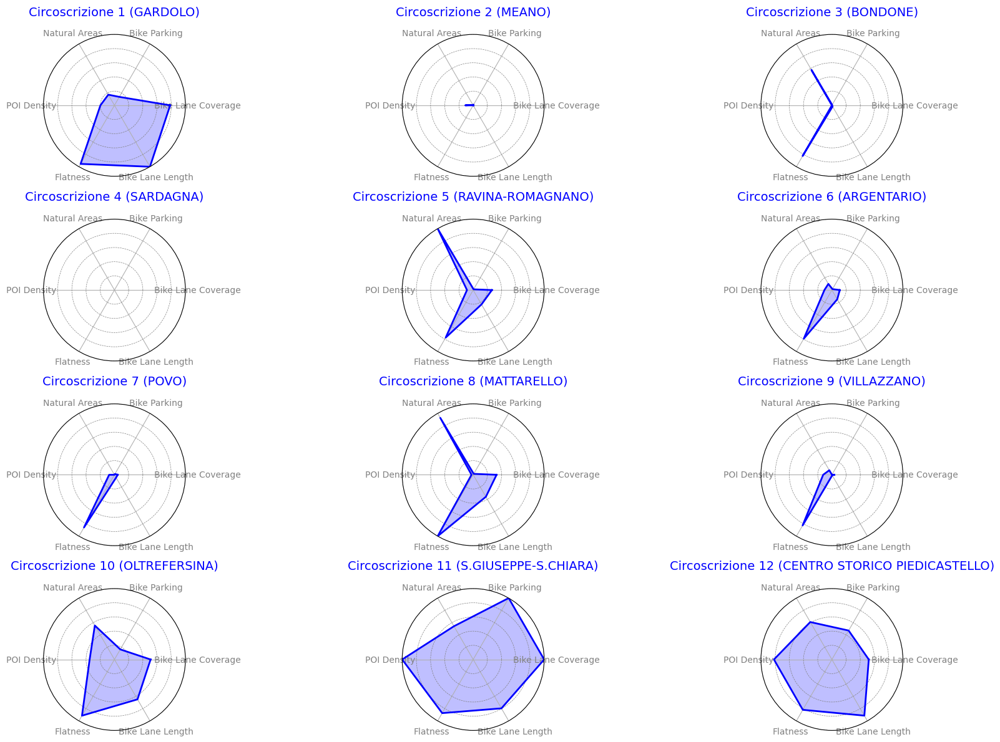

In [498]:
def make_radar_chart(ax, categories, values, title, color):
    """
    Draws a radar chart on the provided polar axis.

    Parameters:
      ax: Matplotlib polar axis.
      categories: List of category labels.
      values: Array of normalized values (assumed between 0 and 1).
      title: Title for the radar chart.
      color: Color for the line and fill.
    """
    N = len(categories)
    # Compute angle for each category.
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    # Convert values to list and close the loop.
    values = values.tolist()
    values += values[:1]
    angles += angles[:1]

    # Plot the radar chart.
    ax.plot(angles, values, color=color, linewidth=2)
    ax.fill(angles, values, color=color, alpha=0.25)

    # Set category labels.
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, color="grey", size=10)

    # Set the title.
    ax.set_title(title, size=14, color=color, y=1.1)

    # Set radial limits and add gridlines.
    ax.set_ylim(0, 1)
    ax.yaxis.grid(True, color='grey', linestyle='dashed', linewidth=0.5)
    ax.set_yticklabels([])

    # Adjust radial label position (optional).
    ax.set_rlabel_position(180)

df_norm = final_df[["numero_circ", "nome"] + cols].set_index("numero_circ").sort_index()

# Create a 4x3 grid of polar subplots.
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 12), subplot_kw=dict(polar=True))
axes = axes.flatten()

# Plot one radar chart per circoscrizione, ordered by circoscrizione number.
for i, circ in enumerate(sorted(df_norm.index)):
    values = df_norm.loc[circ, cols].values
    # Get the name from the "nome" column.
    circ_name = df_norm.loc[circ, "nome"]
    make_radar_chart(axes[i], categories, values, f"Circoscrizione {circ} ({circ_name})", "blue")

# Remove any unused axes if there are fewer than 12 circoscrizioni.
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Walkability

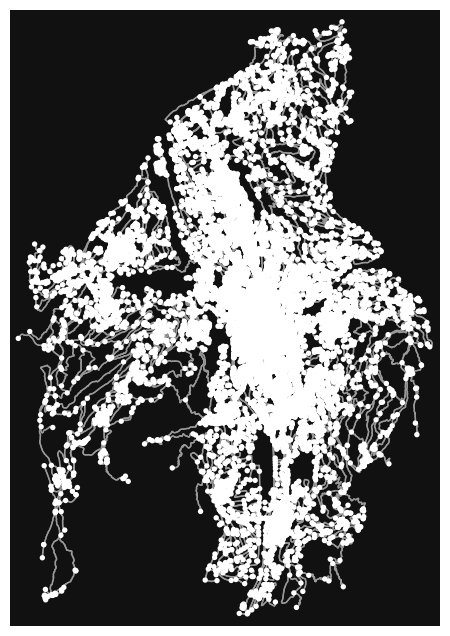

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [516]:
# Get the walking network within the city boundary
walkways = ox.graph_from_polygon(polygon, network_type="walk")

# Reproject the graph to EPSG:32632 for accurate spatial analysis
# EPSG:32632 is a UTM projection for Northern Italy, which uses meters instead of degrees.
#It's better for distance calculations, slope analysis, and spatial accuracy in local studies.
crs = "EPSG:32632"
walkways = ox.projection.project_graph(walkways, to_crs=crs)
walk_nodes, walk_edges = ox.graph_to_gdfs(walkways)

ox.plot_graph(walkways)

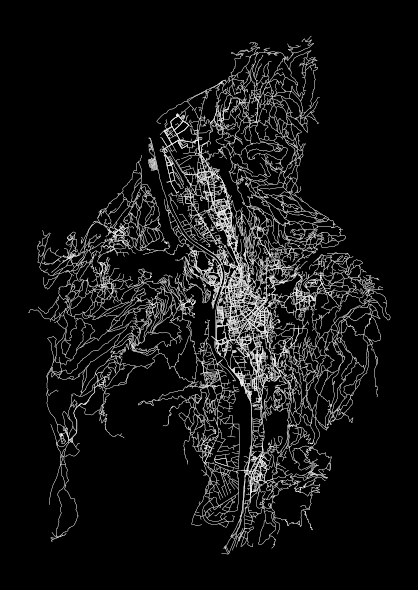

In [517]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot data
walk_edges.plot(ax=ax, color='white', linewidth=0.2)

# Tight layout
plt.tight_layout()

In [ ]:
# Load isoipse data
isoipsa = gpd.read_file("isoipsa.geojson", engine="fiona").to_crs(epsg=32632)

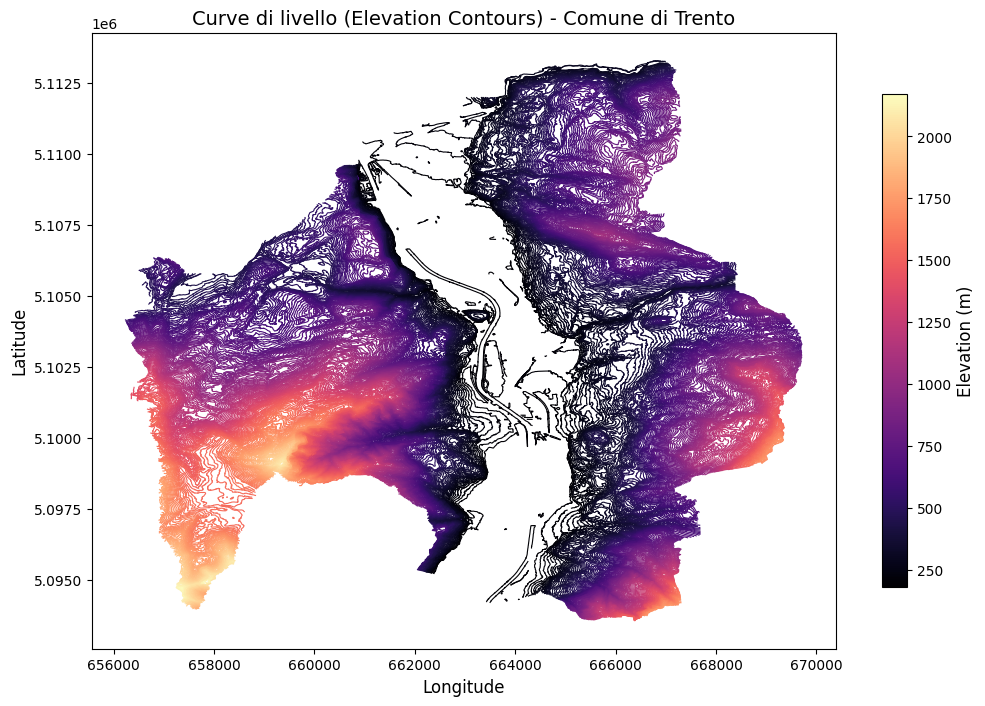

In [526]:
plt.rcdefaults()

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Normalize elevation values for colormap
norm = mcolors.Normalize(vmin=isoipsa["dxf_elevat"].min(), vmax=isoipsa["dxf_elevat"].max())
cmap = cm.magma  # Use the magma colormap

# Plot each contour line with a color based on its elevation
for _, row in isoipsa.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.dxf_elevat)), linewidth=0.8)

# Add colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=12)

# Set title and labels
ax.set_title("Curve di livello (Elevation Contours) - Comune di Trento", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

plt.show()


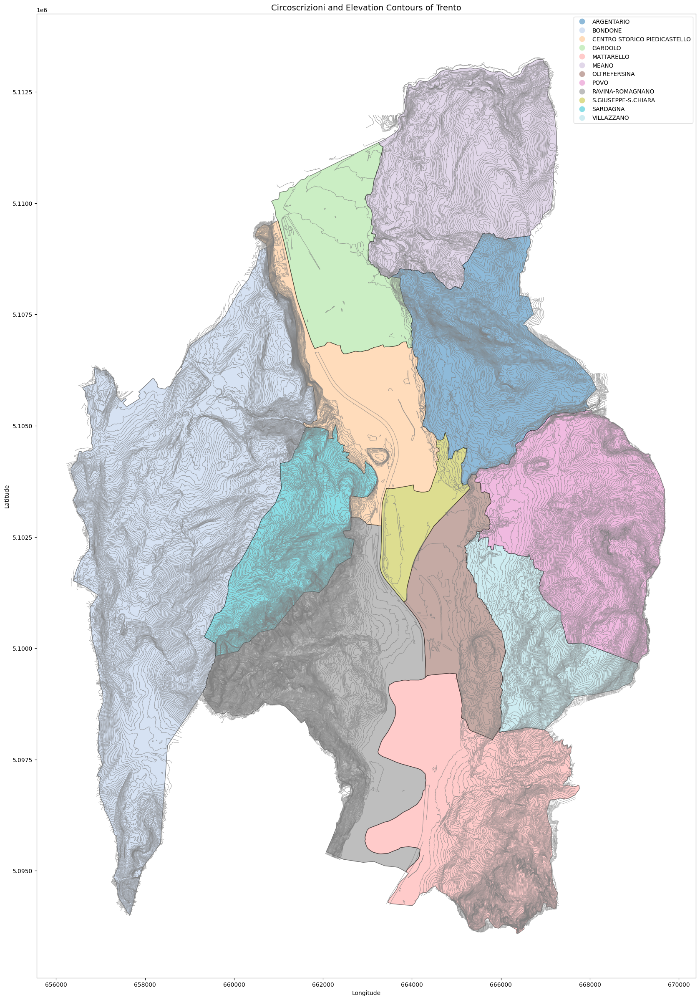

In [527]:
# Create plot
fig, ax = plt.subplots(figsize=(30, 30))

# Use a larger categorical colormap
circoscrizioni.plot(ax=ax, column="nome", cmap="tab20", edgecolor="black", alpha=0.5, legend=True)

# Overlay the elevation contours (isoipse)
isoipsa.plot(ax=ax, color="gray", linewidth=0.8, alpha=0.7)

# Add labels and title
plt.title("Circoscrizioni and Elevation Contours of Trento", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()


In [528]:
# ALTITUDE

# Extract elevation points
isoipsa['elevation'] = isoipsa['dxf_elevat'].astype(float)  # Convert to numeric
elevation_points = np.array([isoipsa.geometry.centroid.x, isoipsa.geometry.centroid.y, isoipsa['elevation']]).T

# Build KDTree for fast nearest neighbor search
tree = cKDTree(elevation_points[:, :2])

In [529]:
# Function to get elevation based on nearest contour line
def get_elevation(x, y):
    dist, idx = tree.query([x, y])
    return elevation_points[idx, 2]  # Return corresponding elevation

In [530]:
# Compute elevation at the midpoint of each edge
walk_edges['mid_x'] = walk_edges.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).x)
walk_edges['mid_y'] = walk_edges.geometry.apply(lambda g: g.interpolate(0.5, normalized=True).y)
walk_edges['elevation'] = walk_edges.apply(lambda row: get_elevation(row.mid_x, row.mid_y), axis=1)

print("Minimum elevation", walk_edges['elevation'].min())
print("Maximum elevation", walk_edges['elevation'].max())

Minimum elevation 178.83
Maximum elevation 2170.0


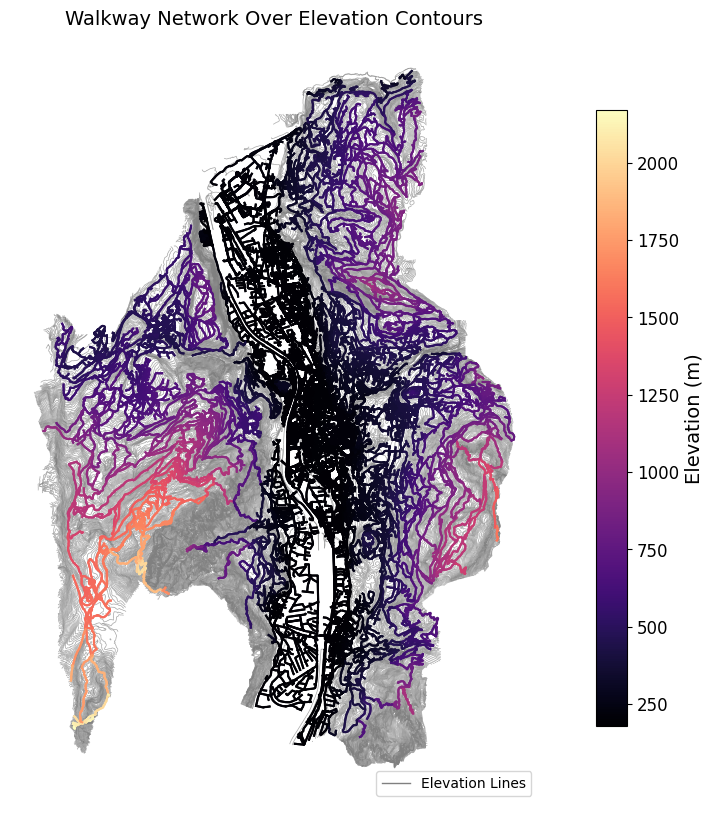

In [531]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_axis_off()
ax.set_aspect("equal")

# Plot isoipse (contour lines)
isoipsa.plot(ax=ax, color="gray", linewidth=0.5, alpha=0.7, label="Elevation Lines")

# Choose a better colormap
cmap = plt.cm.magma
norm = mcolors.Normalize(vmin=walk_edges['elevation'].min(), vmax=walk_edges['elevation'].max())

# Plot each sidewalk edge with color based on altitude
for _, row in walk_edges.iterrows():
    ax.plot(*row.geometry.xy, color=cmap(norm(row.elevation)), linewidth=1.5)

# Add colorbar with explicit tick labels in meters
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label("Elevation (m)", fontsize=14)
cbar.ax.tick_params(labelsize=12)

# Fix legend: manually add entries
legend_elements = [
    Line2D([0], [0], color="gray", lw=1, label="Elevation Lines"),
]
ax.legend(handles=legend_elements, loc="lower right")

plt.title("Walkway Network Over Elevation Contours", fontsize=14)
plt.show()

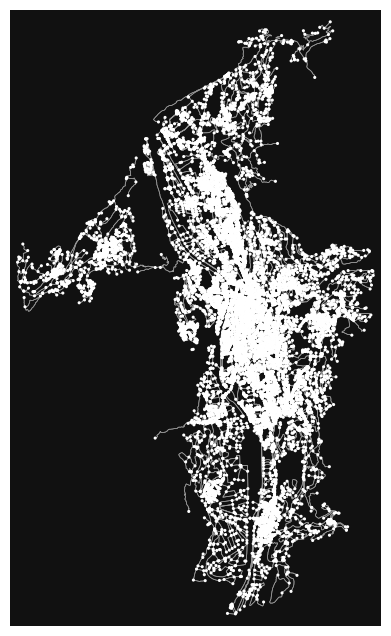

In [532]:
#Altitudine Sardagna: 565 m

filtered_edges = walk_edges[walk_edges['elevation'] < 600].copy()
filtered_edges = filtered_edges.reset_index()  # Ensure 'u' and 'v' are columns
filtered_nodes = set(filtered_edges["u"]) | set(filtered_edges["v"])
filtered_walk_nodes = walk_nodes[walk_nodes.index.isin(filtered_nodes)]


# Create a new graph
graph = nx.MultiDiGraph()

# Add nodes back with their attributes
for node_id, node_data in filtered_walk_nodes.iterrows():
    graph.add_node(node_id, **node_data.to_dict())

# Add edges with their full attributes
for _, edge_data in filtered_edges.iterrows():
    graph.add_edge(edge_data["u"], edge_data["v"], **edge_data.drop(["u", "v"]).to_dict())

# Preserve the original CRS
graph.graph["crs"] = walkways.graph["crs"]
nodes, edges = ox.graph_to_gdfs(graph)
fig, ax = ox.plot_graph(graph, node_size=5, edge_linewidth=0.5, show=True)

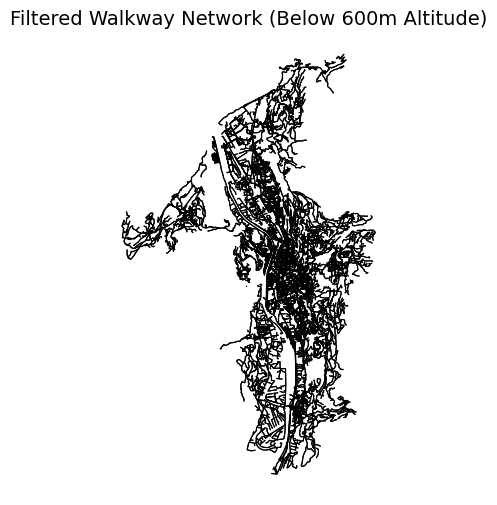

In [533]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot edges
edges.plot(ax=ax, color="black", linewidth=0.8)

# Set title
ax.set_title("Filtered Walkway Network (Below 600m Altitude)", fontsize=14)

# Remove axis ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

plt.show()

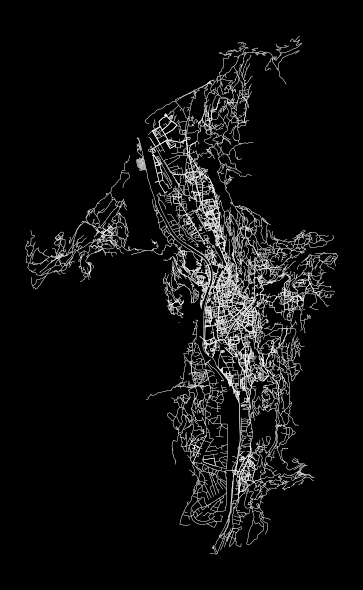

In [534]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot data
edges.plot(
    ax=ax,
    color='white',
    linewidth=0.2
)

# Tight layout
plt.tight_layout()

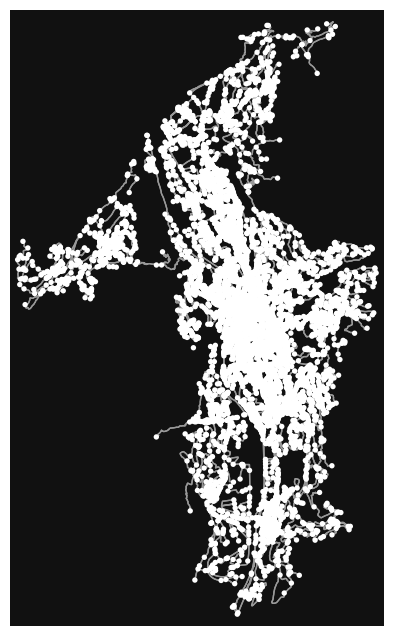

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [535]:
graph_simplified = ox.simplification.consolidate_intersections(
    # Graph to simplify
    graph,
    # buffer around each node (project the graph beforehand)
    tolerance=5,
    # Get result as graph (False to get nodes only as gdf)
    rebuild_graph=True,
    # no dead ends
    dead_ends=False,
    # Reconnect (False to get intersections only)
    reconnect_edges=True
)
crs = "EPSG:32632"
graph_simplified = ox.projection.project_graph(graph_simplified, to_crs=crs)
nodes_s, edges_s = ox.graph_to_gdfs(graph_simplified)
ox.plot_graph(graph_simplified)

In [542]:
print(edges.crs)
xmin, ymin, xmax, ymax = edges.total_bounds
print(f"Bounding box of edges: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")
# Simplified
xmin_s, ymin_s, xmax_s, ymax_s = edges_s.total_bounds
print(f"Bounding box of edges_s: xmin={xmin_s}, xmax={xmax_s}, ymin={ymin_s}, ymax={ymax_s}")

# Print info
print(
    '\nNumber of nodes: - original graph: '+str(len(nodes))
    +'  - simplified graph: '+str(len(nodes_s))
)

EPSG:32632
Bounding box of edges: xmin=656844.12340662, xmax=668266.3254038118, ymin=5094236.523220613, ymax=5113189.632449756
Bounding box of edges_s: xmin=656844.12340662, xmax=668266.3254038118, ymin=5094244.970973965, ymax=5113047.544250995

Number of nodes: - original graph: 18197  - simplified graph: 8498


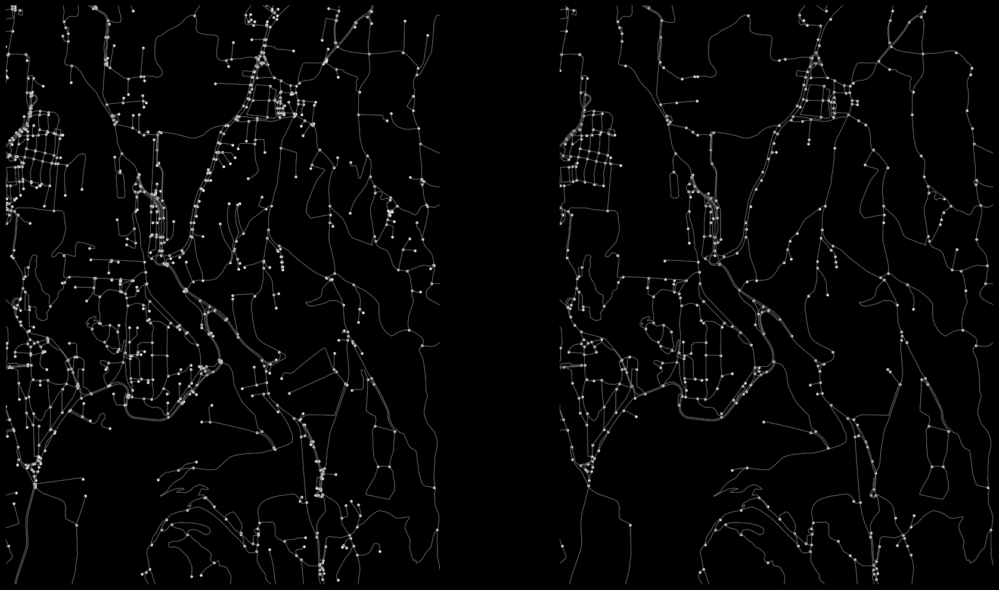

In [543]:
# Define colors
edgecol = [0.5,0.5,0.5]
nodecol = 'white'
linewidth = 0.5
markersize = 5

# Setup plot
fig, ax = plt.subplots(ncols=2, figsize=(20,10))
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
fig.set_facecolor('black')

# Plot original graph
edges.plot(ax=ax[0], color=edgecol, linewidth=linewidth)
nodes.plot(ax=ax[0], color=nodecol, markersize=markersize)

# Plot simplified graph
edges_s.plot(ax=ax[1], color=edgecol, linewidth=linewidth)
nodes_s.plot(ax=ax[1], color=nodecol, markersize=markersize)

# Zoom in
plt.setp(ax[0], xlim=(665000, 666500), ylim=(5100000, 5102000))
plt.setp(ax[1], xlim=(665000, 666500), ylim=(5100000, 5102000))

# Tight layout
plt.tight_layout()

Using vmax: 16.996


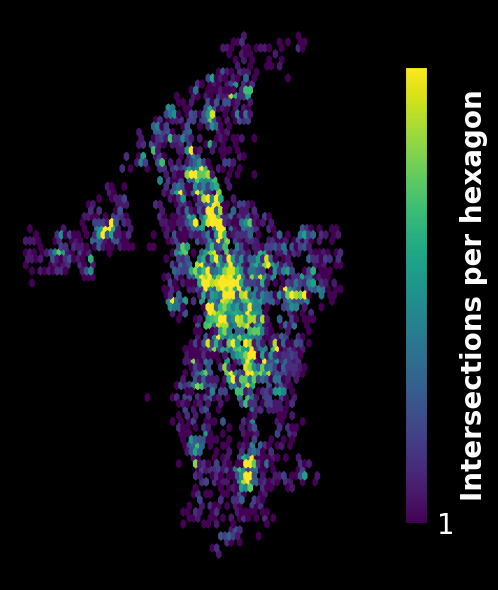

In [546]:
# Set all text color to white
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

vmax_value = nodes_s.shape[0] / 500  # Adjust divisor to control max density range
hb = ax.hexbin(
    x=nodes_s['x'],
    y=nodes_s['y'],
    gridsize=75,
    cmap='viridis',
    mincnt=1,
    vmax=vmax_value,  # Dynamically adjust max value
)
print(f"Using vmax: {vmax_value}")


# Colorbar
cb = plt.colorbar(hb, ax=ax, shrink=0.8, ticks=[1, 20, 40, 60, 80, 100])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['1', '20', '40', '60', '80', '>= 100'])
cb.set_label('Intersections per hexagon', fontsize=20, fontweight='bold')

# Tight layout
plt.tight_layout()

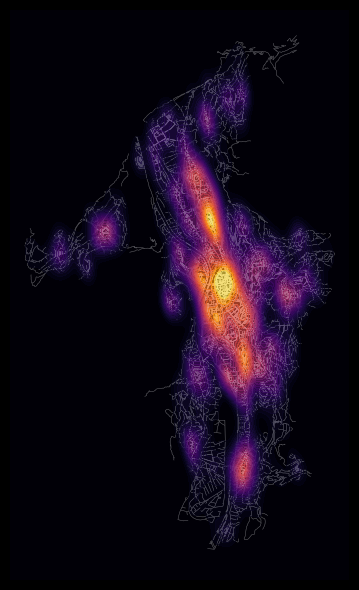

In [551]:
# Setup plot
fig, ax = plt.subplots(figsize=(10,6))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor('black')

# Plot streets underneath
edges.plot(ax=ax, color=[1,1,1], linewidth=0.3, zorder=0)

# Plot KDE on top
sns.kdeplot(
    ax=ax,
    data=nodes_s,
    x='x', y='y',
    hue=None,
    fill=True,
    cmap='inferno',  # Stronger contrast
    thresh=0,
    levels=30,  # More contour levels
    alpha=0.7,  # Slightly less transparency
    zorder=10,
    bw_adjust=0.5  # More detailed density
)

# Tight layout
plt.tight_layout()


                                         geometry addr:housenumber  \
element id                                                           
node    247887464  POINT (665525.458 5104255.221)               13   
        248051531  POINT (665465.587 5104127.425)               27   
        259973562  POINT (665396.468 5108452.823)                2   
        268401562  POINT (664033.084 5103759.573)               40   
        268401567  POINT (664114.589 5103764.327)                1   

                  addr:postcode             addr:street     amenity  \
element id                                                            
node    247887464   38121-38123  Via degli Alberti Poja  restaurant   
        248051531           NaN         Via per Cognola         NaN   
        259973562           NaN         Via del Lavaron  restaurant   
        268401562         38122        Piazza del Duomo        cafe   
        268401567         38122       Piazza Mario Pasi        cafe   

           

<Axes: >

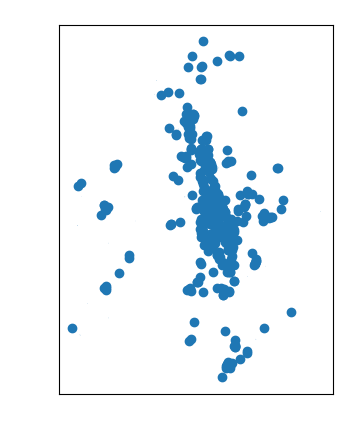

In [552]:
# Select points of interest based on osm tags
tags = {
    'amenity':[
        'cafe',
        'bar',
        'pub',
        'restaurant'
    ],
    'shop':[
        'bakery',
        'convenience',
        'supermarket',
        'mall',
        'department_store',
        'clothes',
        'fashion',
        'shoes'
    ],
    'leisure':[
        'fitness_centre'
    ]
}


# Get POIs from OSM
pois = ox.features_from_polygon(polygon, tags)
# Project pois
pois = pois.to_crs(epsg=32632)

# Display first few POIs
print(pois.head())

# Plot POIs
pois.plot()

In [553]:
# Max time to walk in minutes (no routing to nodes further than this)
walk_time = 15

# Walking speed
walk_speed = 4.5

# Set a uniform walking speed on every edge
for u, v, data in graph.edges(data=True):
    data['speed_kph'] = walk_speed
graph = ox.add_edge_travel_times(graph)

# Extract node/edge GeoDataFrames, retaining only necessary columns (for pandana)
nodes = ox.graph_to_gdfs(graph, edges=False)[['x', 'y']]
edges = ox.graph_to_gdfs(graph, nodes=False).reset_index()[['u', 'v', 'travel_time']]

In [554]:
# Construct the pandana network model
network = pandana.Network(
    node_x=nodes['x'],
    node_y=nodes['y'],
    edge_from=edges['u'],
    edge_to=edges['v'],
    edge_weights=edges[['travel_time']]
)

# Extract centroids from the pois' geometries
centroids = pois.centroid

In [555]:
# Specify a max travel distance for analysis
# Minutes -> seconds
maxdist = walk_time * 60

# Set the pois' locations on the network
network.set_pois(
    category='pois',
    maxdist=maxdist,
    maxitems=10,
    x_col=centroids.x,
    y_col=centroids.y
)

In [556]:
# calculate travel time to 10 nearest pois from each node in network
distances = network.nearest_pois(
    distance=maxdist,
    category='pois',
    num_pois=10
)

distances.astype(int).head()


,1,2,3,4,5,6,7,8,9,10
osmid,,,,,,,,,,
9191982,332,481,494,524,545,569,681,724,724,734
9013746935,336,486,498,528,550,574,686,728,728,739
2454602411,378,448,478,527,591,615,727,770,770,780
9013746938,307,457,518,521,544,548,656,699,699,710
9192420,783,872,885,900,900,900,900,900,900,900


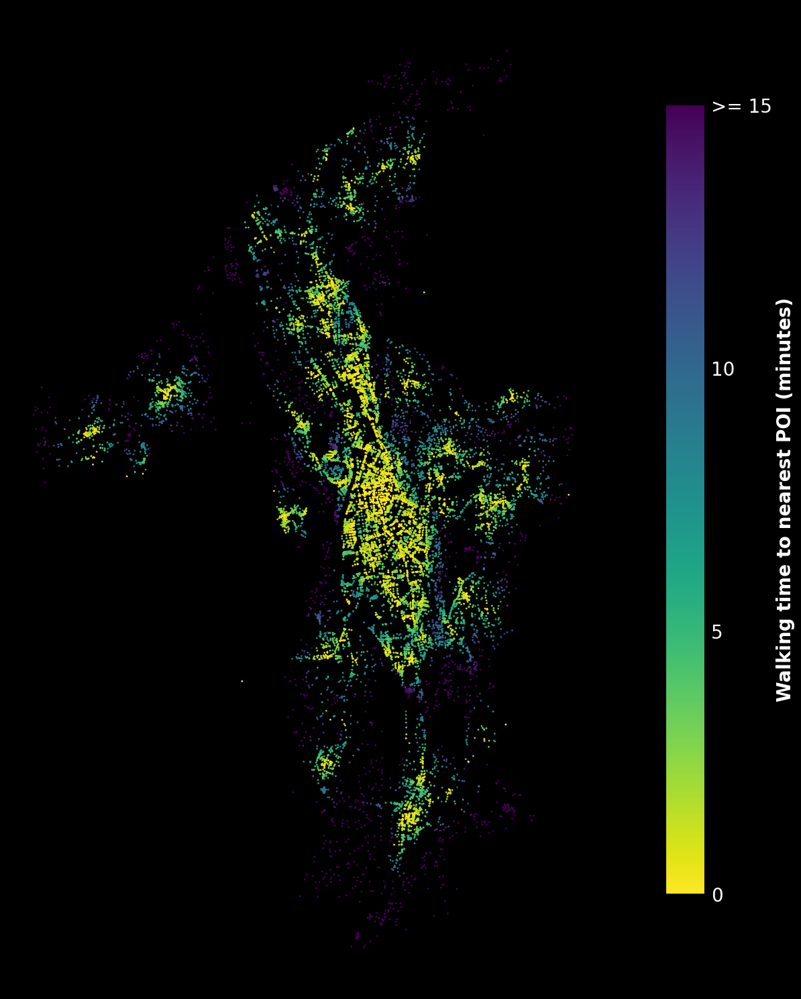

In [557]:
# Set text parameters
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

# Setup plot
fig, ax = plt.subplots(figsize=(20,15))
ax.set_axis_off()
ax.set_aspect('equal')
fig.set_facecolor((0,0,0))

# Plot distance to nearest POI
sc = ax.scatter(
    x=nodes['x'],
    y=nodes['y'],
    c=distances[1],
    s=1,
    cmap='viridis_r',
)

# Colorbar
cb = fig.colorbar(sc, ax=ax, shrink=0.8, ticks=[0, 300, 600, 900])
cb.ax.tick_params(color='none', labelsize=20)
cb.ax.set_yticklabels(['0', '5', '10', '>= 15'])
cb.set_label('Walking time to nearest POI (minutes)', fontsize=20, fontweight='bold')

# Remove empty space
plt.tight_layout()

<ipython-input-558-6b9317228b87>:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


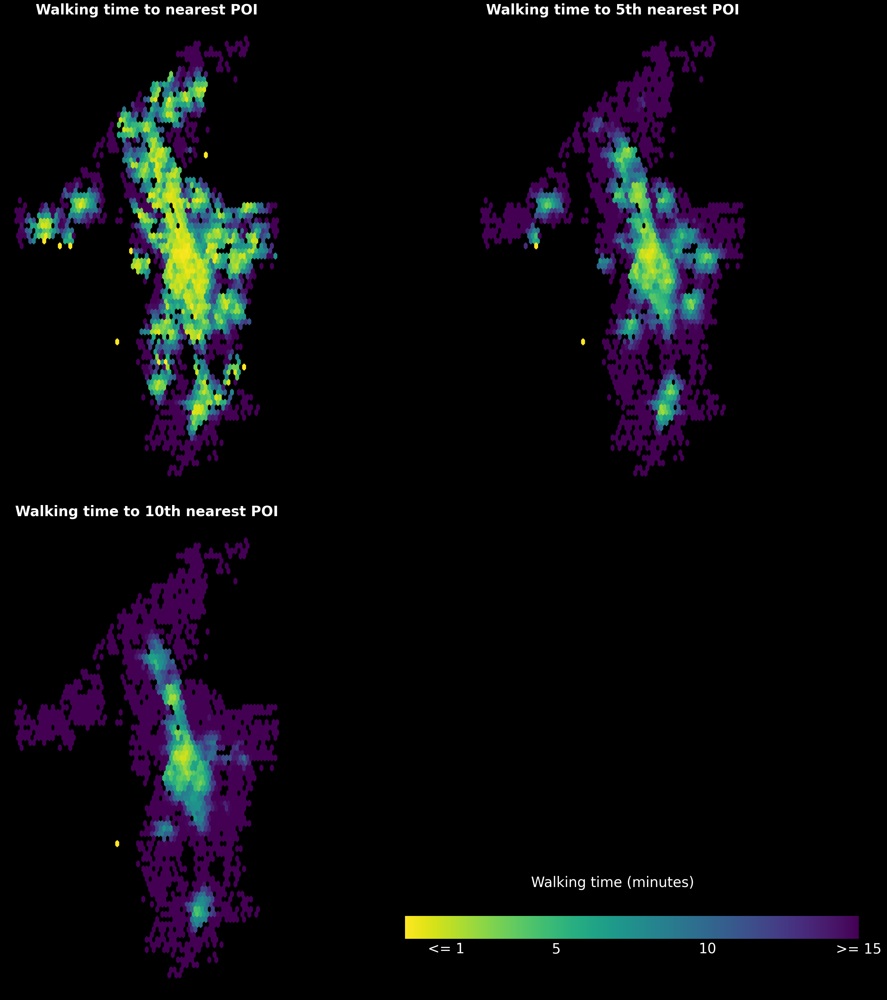

In [558]:
# Setup plot
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(30,30), constrained_layout=False)
ax[0][0].set_axis_off()
ax[0][1].set_axis_off()
ax[1][0].set_axis_off()
ax[1][1].set_axis_off()
ax[0][0].set_aspect('equal')
ax[0][1].set_aspect('equal')
ax[1][0].set_aspect('equal')

# Specify colors
fig.set_facecolor('black')
cmap = 'viridis_r'

# Plot distance to nearest POI
hb = ax[0][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[1],
    alpha=1
)

# Plot distance to 5th nearest POI
hb = ax[0][1].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[5],
    alpha=1
)

# Plot distance to 10th nearest POI
hb = ax[1][0].hexbin(
    x=nodes['x'],
    y=nodes['y'],
    gridsize=75,
    cmap=cmap,
    C=distances[10],
    alpha=1
)

# Add titles to maps
ax[0][0].set_title('Walking time to nearest POI', fontsize=30, fontweight='bold')
ax[0][1].set_title('Walking time to 5th nearest POI', fontsize=30, fontweight='bold')
ax[1][0].set_title('Walking time to 10th nearest POI', fontsize=30, fontweight='bold')

# Setup color bar axis (location of color bar)
cbar_ax = fig.add_axes([0.5, 0.01, 0.5, 0.5])
cbar_ax.set_axis_off()

# Color bar properties
cb = plt.colorbar(
    hb,
    ax=cbar_ax,
    shrink=0.9,
    ticks=[82, 300, 600, 900],
    orientation='horizontal',
    aspect=20
)

cb.outline.set_edgecolor('none')
cb.ax.tick_params(color='none', labelsize=30)
cb.ax.set_xticklabels(['<= 1', '5', '10', '>= 15'])

# Title for color bar
ax[1][1].text(0.5, 0.23, 'Walking time (minutes)', fontsize=30, ha='center')

# Tight layout
plt.tight_layout()